<a href="https://colab.research.google.com/github/idobaum/TLVArchiveAnalyzer/blob/main/notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%matplotlib inline
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
#matplotlib.use('Agg')
from collections import Counter
import matplotlib.pyplot as plt
from scipy import signal
from tqdm import tqdm
from jupyterthemes import jtplot
jtplot.style(context='talk', fscale=1.4, spines=False, gridlines='--')
import string
from sklearn.cluster import KMeans
pd.options.display.width = 0
from sklearn.preprocessing import MinMaxScaler
import csv
from scipy.spatial.distance import cdist
from sklearn.decomposition import PCA
from sklearn import preprocessing
scaler = preprocessing.MinMaxScaler()
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
pd.set_option('display.expand_frame_repr', False)
sns.set(rc={'figure.figsize':(20,10),"figure.dpi": 96})
pd.set_option('display.max_colwidth', None)
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import fcluster
from itertools import combinations
import glob
import re
import itertools
from sklearn import linear_model



In [ ]:
df = pd.read_csv('all_permits.csv')
df

,ktatrova,ms_gush,ms_chelka,multiple_gush_chelka,address,tik_id,page_number,row_number,date,type,request,permit,size,document
0,11,7221,19,NaN,בורלא יהודה 29,21160290,1,10,29/10/2001,היתר-תכנית חתומה,20011056,910873,18.1MB,X:\Data\ArchiveTLV\results\11\21160290\0433066...
1,11,7221,19,NaN,בורלא יהודה 29,21160290,1,10,29/10/2001,היתר-תכנית חתומה,20011056,910873,18.1MB,X:\Data\ArchiveTLV\results\11\21160290\0433066...
2,11,7221,19,NaN,בורלא יהודה 29,21160290,2,6,14/04/1997,היתר-תכנית חתומה,19961670,1-970372,14.2MB,X:\Data\ArchiveTLV\results\11\21160290\0433066...
3,11,7221,19,NaN,בורלא יהודה 29,21160290,2,13,25/04/1996,היתר-תכנית חתומה,19940752,960395,40.0MB,X:\Data\ArchiveTLV\results\11\21160290\0433067...
4,11,7221,19,NaN,בורלא יהודה 29,21160290,3,7,06/12/1989,היתר-תכנית חתומה,NaN,1/41,44.0MB,X:\Data\ArchiveTLV\results\11\21160290\0433067...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136638,94,6129,64,"6129 / 64, 6129 / 67, 6129 / 68, 6129 / 138",צוברי יוסף הרב 22,48640220,1,1,18/05/2011,היתר-תכנית חתומה,20101099,11-0262,18.0MB,X:\Data\ArchiveTLV\results\94\48640220\1314049...
136639,94,6129,64,"6129 / 64, 6129 / 67, 6129 / 68, 6129 / 138",צוברי יוסף הרב 22,48640220,2,2,17/01/2010,היתר-תכנית חתומה,20090263,09-0985,26.1MB,X:\Data\ArchiveTLV\results\94\48640220\1314049...
136640,94,6129,64,"6129 / 64, 6129 / 67, 6129 / 68, 6129 / 138",צוברי יוסף הרב 22,48640220,6,16,13/01/2005,היתר-תכנית חתומה,20040396,250044,30.0MB,X:\Data\ArchiveTLV\results\94\48640220\1314048...
136641,94,7203,113,"7203 / 112, 7203 / 113",וקנין רפי 6,48610060,1,25,04/04/2001,היתר-תכנית חתומה,20001024,6-210268,6.2MB,X:\Data\ArchiveTLV\results\94\48610060\1313007...


In [ ]:
with_coords = pd.read_csv('tel-aviv-yaffo_with_coords.csv')
with_coords

,ID,AssetID,Region_ID,GushNum,ParcelNum,SubParcelNum,BuildingFloors,BuildingYear,SettlmentID,SettlementNameHeb,...,HouseNum,Entrance,ZipCode,AddressID,X_RECOMMENDED,Y_RECOMMENDED,Type,EstimatedAppartments,EstimatedBuildings,Coordinates
0,01/01/6014,4026058,NaN,6014,1,1,NaN,NaN,5000,תל אביב -יפו,...,NaN,NaN,NaN,NaN,179555.0000,660459.0000,דירת מגורים חדשה,NaN,NaN,"(32.0852997, 34.7818064)"
1,6034-1-0,3002,5.0,6034,1,0,NaN,NaN,5000,תל אביב -יפו,...,21.0,?,13.0,NaN,180193.7749,661589.4918,חלקה בנויה,NaN,NaN,"(32.046855, 34.78877)"
2,6034-3-0,3004,5.0,6034,3,0,NaN,NaN,5000,תל אביב -יפו,...,9.0,NaN,13.0,53741738.0,180217.8742,661534.8825,חלקת בסיס בבית משותף,NaN,NaN,"(32.0464556, 34.7892436)"
3,01/03/6034,4400248,NaN,6034,3,1,1.0,1970.0,5000,תל אביב -יפו,...,1.0,NaN,13.0,53740712.0,180266.8138,661539.5267,דירת מגורים חדשה,NaN,NaN,"(32.046456, 34.788684)"
4,03/03/6034,4400249,NaN,6034,3,3,1.0,1970.0,5000,תל אביב -יפו,...,1.0,NaN,13.0,53740712.0,180266.8138,661539.5267,דירת מגורים חדשה,NaN,NaN,"(32.046456, 34.788684)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
232990,9032-28-0,338412,5.0,9032,28,0,NaN,NaN,5000,תל אביב -יפו,...,17.0,NaN,13.0,53752103.0,179630.2154,662764.7797,חלקת בסיס בבית משותף,NaN,NaN,"(32.057378, 34.782694)"
232991,9032-28-1,4357849,NaN,9032,28,1,NaN,NaN,5000,תל אביב -יפו,...,17.0,NaN,13.0,53752103.0,179630.2154,662764.7797,דירת מגורים חדשה,NaN,NaN,"(32.057378, 34.782694)"
232992,9032-30-0,338414,5.0,9032,30,0,NaN,NaN,5000,תל אביב -יפו,...,19.0,NaN,13.0,53751842.0,179646.0328,662761.9414,חלקה בנויה,NaN,NaN,"(32.057365, 34.78292)"
232993,9032-40-0,80944846,5.0,9032,40,0,NaN,NaN,5000,תל אביב -יפו,...,1.0,NaN,0.0,64834149.0,179505.2970,662781.9878,חלקה בנויה,NaN,NaN,"(32.057561, 34.781384)"


In [ ]:
merged = df.merge(with_coords, how="left", left_on=['ms_gush','ms_chelka'], right_on=['GushNum','ParcelNum'])
merged = merged[merged['Coordinates'].notna()]
merged

,ktatrova,ms_gush,ms_chelka,multiple_gush_chelka,address,tik_id,page_number,row_number,date,type,...,HouseNum,Entrance,ZipCode,AddressID,X_RECOMMENDED,Y_RECOMMENDED,Type,EstimatedAppartments,EstimatedBuildings,Coordinates
0,11,7221,19,NaN,בורלא יהודה 29,21160290,1,10,29/10/2001,היתר-תכנית חתומה,...,29.0,NaN,13.0,NaN,180355.6026,668477.8182,חלקה בנויה,NaN,NaN,"(32.1088965, 34.7904959)"
1,11,7221,19,NaN,בורלא יהודה 29,21160290,1,10,29/10/2001,היתר-תכנית חתומה,...,29.0,NaN,13.0,NaN,180355.6026,668477.8182,חלקה בנויה,NaN,NaN,"(32.1088965, 34.7904959)"
2,11,7221,19,NaN,בורלא יהודה 29,21160290,2,6,14/04/1997,היתר-תכנית חתומה,...,29.0,NaN,13.0,NaN,180355.6026,668477.8182,חלקה בנויה,NaN,NaN,"(32.1088965, 34.7904959)"
3,11,7221,19,NaN,בורלא יהודה 29,21160290,2,13,25/04/1996,היתר-תכנית חתומה,...,29.0,NaN,13.0,NaN,180355.6026,668477.8182,חלקה בנויה,NaN,NaN,"(32.1088965, 34.7904959)"
4,11,7221,19,NaN,בורלא יהודה 29,21160290,3,7,06/12/1989,היתר-תכנית חתומה,...,29.0,NaN,13.0,NaN,180355.6026,668477.8182,חלקה בנויה,NaN,NaN,"(32.1088965, 34.7904959)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2143690,94,7243,6,NaN,"רוטנשטרייך 32, הטייסים 118, רוטנשטרייך 30, הטי...",7441180,6,19,18/07/1983,היתר-תכנית חתומה,...,30.0,NaN,13.0,53915348.0,182492.2049,661562.9707,דירת מגורים,NaN,NaN,"(32.046688, 34.81306)"
2143691,94,7243,6,NaN,"רוטנשטרייך 32, הטייסים 118, רוטנשטרייך 30, הטי...",7441180,6,19,18/07/1983,היתר-תכנית חתומה,...,30.0,NaN,13.0,53915348.0,182492.2049,661562.9707,דירת מגורים,NaN,NaN,"(32.046688, 34.81306)"
2143692,94,7243,6,NaN,"רוטנשטרייך 32, הטייסים 118, רוטנשטרייך 30, הטי...",7441180,6,19,18/07/1983,היתר-תכנית חתומה,...,30.0,NaN,13.0,53915348.0,182492.2049,661562.9707,דירת מגורים,NaN,NaN,"(32.046688, 34.81306)"
2143696,94,7203,113,"7203 / 112, 7203 / 113",וקנין רפי 6,48610060,1,25,04/04/2001,היתר-תכנית חתומה,...,6.0,NaN,13.0,53838076.0,181800.5572,662169.6071,חלקה בנויה,NaN,NaN,"(31.9255628, 34.7961139)"


In [ ]:

permits_with_coords = pd.read_csv('permits_with_coords.csv', low_memory=False)
permits_with_coords = permits_with_coords[permits_with_coords['date'].notna()]
permits_with_coords['date'] = permits_with_coords['date'].str[6:10]
permits_with_coords['date'] = permits_with_coords['date'].astype('int')

permits_with_coords['range'] = pd.cut(permits_with_coords.date,np.arange(1925, 2026, 10))
with_min = permits_with_coords.groupby(["X_RECOMMENDED","Y_RECOMMENDED"], as_index=False)['date'].agg('min')
merged = permits_with_coords.merge(with_min, how='right',)
merged.shape

sns.set(rc={'figure.figsize':(20,20),"figure.dpi": 96})
grid = sns.FacetGrid(col = "range", data=merged, hue='range', )
grid.map(sns.scatterplot, "X_RECOMMENDED", 'Y_RECOMMENDED')
plt.show()


In [ ]:
permits = pd.read_csv('all_permits.csv', low_memory=False)
permits.head()
permits = permits[permits['date'].notna()]
permits['date'] = permits['date'].str[6:10]
permits['date'] = permits['date'].astype('int')
permits['range'] = pd.cut(permits.date,np.arange(np.min(permits.date), np.max(permits.date), 10))
permits['ms_gush'] = permits['ms_gush'].astype('str')
permits['ms_chelka'] = permits['ms_chelka'].astype('str')
permits["gush_chelka"] = permits["ms_gush"].astype(str) +'/'+ permits["ms_chelka"]
permits
grouped = permits.groupby(['range'])['gush_chelka'].apply(list)
grouped
# grouped.shape
# grouped.to_csv('grouped_gush_chelka.csv')
# sns.set(rc={'figure.figsize':(20,20),"figure.dpi": 96})
# grid = sns.FacetGrid(col = "range", data=permits, hue='range', )
# grid.map(sns.scatterplot, 'gush_chelka', 'multiple_gush_chelka')
# plt.show()


In [ ]:
permits = pd.read_csv('all_permits.csv', low_memory=False)
permits.date = permits.date.str[6:10].astype(int)

permits = permits.drop(permits[permits['date']<1980].index,  axis=0)
permits.shape
permits.to_csv('permits_before_1980.csv')

In [ ]:
import numpy as np
permits = pd.read_csv('all_permits.csv')
data_with_coords = pd.read_csv('ta_jaffo_with_full_addresses.csv')

from tqdm import tqdm
tqdm.pandas()

pd.set_option('precision', 0)

data_with_coords['FullAddress']
# data_with_coords[ data_with_coords['FullAddress'].progress_apply(lambda x: permits['address'].str.contains(x)).any(1) ]
permits = permits[permits['address'].notna()]
data_with_coords = data_with_coords[data_with_coords['FullAddress'].notna()]
data_with_coords.drop_duplicates(subset=['FullAddress'], inplace=True)

merged = permits.merge(data_with_coords, how="left", left_on=['address'], right_on=["FullAddress"]).reset_index(drop=True)

merged = merged[merged['FullAddress'].notna()]

merged = merged[merged['Coordinates'].notna()]

# permits_with_coords.iloc[0].apply(type)
merged['lat'], merged['lng'] = merged.Coordinates.str.split(',').str[0],merged.Coordinates.str.split(',').str[1]
merged.lat = merged.lat.str.replace('(','').astype('float')
merged.lng = merged.lng.str.replace(')','').astype('float')
merged = merged.drop(['Coordinates'],axis=1)
merged['date'] = merged.date.str[6:10].astype('int')
merged['range'] = pd.cut(merged.date,np.arange(1925, 2026, 10))
merged
sns.set(rc={'figure.figsize':(20,20),"figure.dpi": 96})
grid = sns.FacetGrid(col = "range", data=merged, hue='range', )
grid.map(sns.scatterplot, "lat", 'lng')
plt.show()


# merged.plot(x="lat", y="lng", kind="scatter", c="date",
#         colormap="YlOrRd",figsize=(20,20))

# lats = permits_with_coords['Coordinates'].str.get(0)
# lats.head()


In [ ]:
docs = pd.read_csv('all_docs.csv')

docs.date = docs.date.str[6:10]
docs = docs[docs['date'].notna()]
docs

,ktatrova,ms_gush,ms_chelka,multiple_gush_chelka,address,tik_id,page_number,row_number,date,type,request,permit,size,document
0,11,7221,19,NaN,בורלא יהודה 29,21160290,1,1,2017,החלטת ועדה,19940752,NaN,87.1KB,X:\Data\ArchiveTLV\results\11\21160290\RBM_19940752_3_20170427175618.pdf
1,11,7221,19,NaN,בורלא יהודה 29,21160290,1,2,2017,החלטת ועדה,19940752,NaN,85.7KB,X:\Data\ArchiveTLV\results\11\21160290\RBM_19940752_2_20170427175620.pdf
2,11,7221,19,NaN,בורלא יהודה 29,21160290,1,3,2017,החלטת ועדה,19940752,NaN,99.8KB,X:\Data\ArchiveTLV\results\11\21160290\RBM_19940752_6_20170427175616.pdf
3,11,7221,19,NaN,בורלא יהודה 29,21160290,1,4,2017,החלטת ועדה,19961670,NaN,96.7KB,X:\Data\ArchiveTLV\results\11\21160290\RBM_19961670_1_20170427215350.pdf
4,11,7221,19,NaN,בורלא יהודה 29,21160290,1,5,2017,החלטת ועדה,19940752,NaN,92.3KB,X:\Data\ArchiveTLV\results\11\21160290\RBM_19940752_4_20170427175609.pdf
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4255208,94,7203,113,"7203 / 112, 7203 / 113",וקנין רפי 6,48610060,5,7,1999,תיק מידע,NaN,NaN,72.7KB,X:\Data\ArchiveTLV\results\94\48610060\13143250.pdf
4255209,94,7203,113,"7203 / 112, 7203 / 113",וקנין רפי 6,48610060,5,8,1999,תיק מידע,NaN,NaN,72.7KB,X:\Data\ArchiveTLV\results\94\48610060\13143251.pdf
4255210,94,7203,113,"7203 / 112, 7203 / 113",וקנין רפי 6,48610060,5,9,1999,תוכנית סניטרית/חיבור ביוב,NaN,NaN,28.0KB,X:\Data\ArchiveTLV\results\94\48610060\13143249.pdf
4255211,94,7203,113,"7203 / 112, 7203 / 113",וקנין רפי 6,48610060,5,10,1996,"מכתבים/פניות,תכתובת פנימית,אחר",NaN,NaN,24.7KB,X:\Data\ArchiveTLV\results\94\48610060\13143231.pdf


In [ ]:
all_docs = pd.read_csv('all_docs.csv')
all_docs


,ktatrova,ms_gush,ms_chelka,multiple_gush_chelka,address,tik_id,page_number,row_number,date,type,request,permit,size,document
0,11,7221,19,NaN,בורלא יהודה 29,21160290,1,1,27/04/2017,החלטת ועדה,19940752,NaN,87.1KB,X:\Data\ArchiveTLV\results\11\21160290\RBM_19940752_3_20170427175618.pdf
1,11,7221,19,NaN,בורלא יהודה 29,21160290,1,2,27/04/2017,החלטת ועדה,19940752,NaN,85.7KB,X:\Data\ArchiveTLV\results\11\21160290\RBM_19940752_2_20170427175620.pdf
2,11,7221,19,NaN,בורלא יהודה 29,21160290,1,3,27/04/2017,החלטת ועדה,19940752,NaN,99.8KB,X:\Data\ArchiveTLV\results\11\21160290\RBM_19940752_6_20170427175616.pdf
3,11,7221,19,NaN,בורלא יהודה 29,21160290,1,4,27/04/2017,החלטת ועדה,19961670,NaN,96.7KB,X:\Data\ArchiveTLV\results\11\21160290\RBM_19961670_1_20170427215350.pdf
4,11,7221,19,NaN,בורלא יהודה 29,21160290,1,5,27/04/2017,החלטת ועדה,19940752,NaN,92.3KB,X:\Data\ArchiveTLV\results\11\21160290\RBM_19940752_4_20170427175609.pdf
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4255208,94,7203,113,"7203 / 112, 7203 / 113",וקנין רפי 6,48610060,5,7,10/10/1999,תיק מידע,NaN,NaN,72.7KB,X:\Data\ArchiveTLV\results\94\48610060\13143250.pdf
4255209,94,7203,113,"7203 / 112, 7203 / 113",וקנין רפי 6,48610060,5,8,10/10/1999,תיק מידע,NaN,NaN,72.7KB,X:\Data\ArchiveTLV\results\94\48610060\13143251.pdf
4255210,94,7203,113,"7203 / 112, 7203 / 113",וקנין רפי 6,48610060,5,9,13/09/1999,תוכנית סניטרית/חיבור ביוב,NaN,NaN,28.0KB,X:\Data\ArchiveTLV\results\94\48610060\13143249.pdf
4255211,94,7203,113,"7203 / 112, 7203 / 113",וקנין רפי 6,48610060,5,10,23/04/1996,"מכתבים/פניות,תכתובת פנימית,אחר",NaN,NaN,24.7KB,X:\Data\ArchiveTLV\results\94\48610060\13143231.pdf


In [ ]:
# cols = with_finals.type.unique().tolist()
cols = ['היתר-תכנית חתומה'
        ,'התנגדות'
        ,'ועדת ערר,ועדת משנה,רשות רישוי,ועדה מחוזית'
        ,'חישוב שטחים'
        ,'חשבון יציבות,תצהיר מהנדס'
        ,'טופס 1'
        ,'טופס 4'
        ,'מסמכי רישוי מקוון החל מדצמבר 2015'
        ,'מסמכים הנדסיים תמא 38'
        ,'מפות מדידה'
        ,'מפת מדידה להיתר'
        ,'נספח אשפה'
        ,'נספח גנים ונוף'
        ,'נספח תברואה-ביוב'
        ,'נספח תנועה וחניה'
        ,'רישום לפי תקנה 27'
        ,'תוכניות היסטוריות שימור'
        ,'תוכניות לא חתומות'
        ,'תוכנית סניטרית/חיבור ביוב'
        ,'תיק תעודת גמר'
        ,'תכנית בינוי/עיצוב'
        ,'תכנית הבקשה להיתר'
        ,'תכנית הבקשה להיתר (אדריכלות)'
        ,'תכנית ההיתר'
        ,'תכנית מתוקנת (אדריכלות)'
        ,'תעודת גמר'
        ,'תקנה 27-תשריט לטאבו'
        ,'תשריט בית משותף'
        ,'היתר מילולי חתום'
]


In [ ]:
with_finals = pd.read_csv('all_merged.csv')
res_list = []
i = 2
for combo in combinations(cols,i):
    df_finals = with_finals[with_finals.type.isin(combo)].groupby(['address','date','final_year'])['multiple_gush_chelka'].size().to_frame().rename(columns={'multiple_gush_chelka':'count'})
    res = df_finals.loc[df_finals.groupby(['address','final_year'])['count'].idxmax()].reset_index()
    print(res)
    diff = np.array(abs(res['date'].astype(float) - res['final_year'].astype(float))).var()
    cols_idxs = [str(cols.index(col)) for col in combo]
    combo_obj = str(diff)+' | '+','.join(cols_idxs)
    res_list.append(combo_obj)
#         if diff<10:
#             print(abs(np.array(res['date'].astype(float) - res['final_year'].astype(float))))
#             print(diff,combo)
# res_list.sort(key = lambda x: x[0])
# best = res_list[0]
res_list.sort()
#print(res_list)
# with open('combo_res.txt','a') as outputf:
#     outputf.write('\n'.join(res_list))


        address    date  final_year  count
0                2015.0         0.0    552
1        1019 1  1962.0         0.0      3
2       1019 11  1997.0         0.0      1
3        1019 5  1960.0         0.0      1
4        1019 9  1959.0         0.0      1
...         ...     ...         ...    ...
34079   תשרי 73  1992.0         0.0      1
34080   תשרי 76  1992.0         0.0      2
34081   תשרי 77  2015.0         0.0      3
34082   תשרי 82  1992.0         0.0      1
34083   תשרי 84  1993.0         0.0      1

[34084 rows x 4 columns]
        address    date  final_year  count
0                1990.0         0.0   2120
1        1019 1  1962.0         0.0      7
2       1019 11  1997.0         0.0      4
3        1019 5  1971.0         0.0      3
4        1019 9  1963.0         0.0      3
...         ...     ...         ...    ...
37717   תשרי 78  1995.0         0.0      1
37718   תשרי 82  1991.0         0.0      5
37719   תשרי 84  1991.0         0.0      1
37720   תשרי 86  1964.0     

KeyboardInterrupt: 

היתר-תכנית חתומה 45
התנגדות 0
ועדת ערר,ועדת משנה,רשות רישוי,ועדה מחוזית 26
חישוב שטחים 0
חשבון יציבות,תצהיר מהנדס 36
טופס 1 0
טופס 4 41
מסמכי רישוי מקוון החל מדצמבר 2015 0
מסמכים הנדסיים תמא 38 0
מפות מדידה 17
מפת מדידה להיתר 0
נספח אשפה 0
נספח גנים ונוף 0
נספח תברואה-ביוב 0
נספח תנועה וחניה 0
רישום לפי תקנה 27 0
תוכניות היסטוריות שימור 11
תוכניות לא חתומות 12
תוכנית סניטרית/חיבור ביוב 46
תיק תעודת גמר 104
תכנית בינוי/עיצוב 0
תכנית הבקשה להיתר 1
תכנית הבקשה להיתר (אדריכלות) 0
תכנית ההיתר 0
תכנית מתוקנת (אדריכלות) 0
תעודת גמר 67
תקנה 27-תשריט לטאבו 0
תשריט בית משותף 0
היתר מילולי חתום 46


{'תיק תעודת גמר': 0.6709677419354839,
 'תעודת גמר': 0.432258064516129,
 'תוכנית סניטרית/חיבור ביוב': 0.2967741935483871,
 'היתר מילולי חתום': 0.2967741935483871,
 'היתר-תכנית חתומה': 0.2903225806451613,
 'טופס 4': 0.2645161290322581,
 'חשבון יציבות,תצהיר מהנדס': 0.23225806451612904,
 'ועדת ערר,ועדת משנה,רשות רישוי,ועדה מחוזית': 0.16774193548387098,
 'מפות מדידה': 0.10967741935483871,
 'תוכניות לא חתומות': 0.07741935483870968,
 'תוכניות היסטוריות שימור': 0.07096774193548387,
 'תכנית הבקשה להיתר': 0.0064516129032258064,
 'התנגדות': 0.0,
 'חישוב שטחים': 0.0,
 'טופס 1': 0.0,
 'מסמכי רישוי מקוון החל מדצמבר 2015': 0.0,
 'מסמכים הנדסיים תמא 38': 0.0,
 'מפת מדידה להיתר': 0.0,
 'נספח אשפה': 0.0,
 'נספח גנים ונוף': 0.0,
 'נספח תברואה-ביוב': 0.0,
 'נספח תנועה וחניה': 0.0,
 'רישום לפי תקנה 27': 0.0,
 'תכנית בינוי/עיצוב': 0.0,
 'תכנית הבקשה להיתר (אדריכלות)': 0.0,
 'תכנית ההיתר': 0.0,
 'תכנית מתוקנת (אדריכלות)': 0.0,
 'תקנה 27-תשריט לטאבו': 0.0,
 'תשריט בית משותף': 0.0}

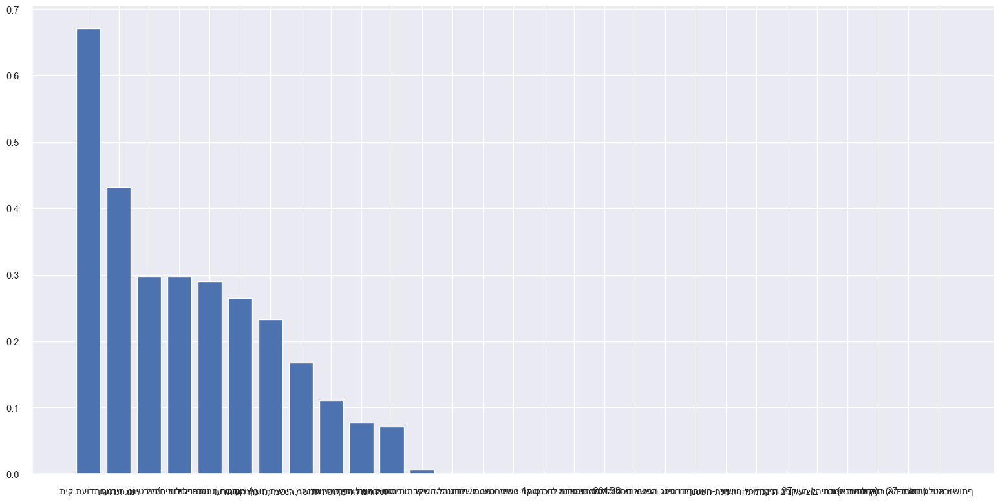

In [ ]:
res = {}
with_finals = pd.read_csv('all_merged.csv')
with_finals = with_finals[with_finals['final_year']>0]
for col in cols:
    try:
        a = with_finals[with_finals.type==col].groupby(['address','date','final_year'])['multiple_gush_chelka'].size().to_frame().rename(columns={'multiple_gush_chelka':'count'})
        total = with_finals.reset_index().address.nunique()
        #a = a.groupby(['address','date','final_year'])['multiple_gush_chelka'].size().to_frame().rename(columns={'multiple_gush_chelka':'count'})
        b = a.loc[a.groupby(['address','final_year'])['count'].idxmax()].reset_index().sort_values(by="final_year")

        b['diff'] = abs(b['final_year'].astype(float) - b['date'])
        #res.append([np.count_nonzero(b['diff'].values<2),col])
        #res[col] = float(np.count_nonzero(b['diff'].values<2)/total)


        #print(col,int(b['date'].mean()))
        res[col] = int(np.count_nonzero(b['diff'].values<2))/total
        print(col, int(np.count_nonzero(b['diff'].values<2)))
    except Exception as e:
        print(e)
res_sorted = {k: v for k, v in sorted(res.items(), key=lambda item: item[1], reverse=True)}
plt.bar(range(len(res)), list(res_sorted.values()), align='center')
plt.xticks(range(len(res)), list(res_sorted.keys()))
res_sorted
    #b.sort_values(by='diff')


In [ ]:
with_finals['type'].unique()

array(['הודעת שומה על היטל השבחה,אגרות בניה,שוברי תשלום', 'תיק מידע',
       'היתר מילולי חתום', 'היתר-תכנית חתומה', 'תיק תעודת גמר',
       'חשבון יציבות,תצהיר מהנדס',
       'ועדת ערר,ועדת משנה,רשות רישוי,ועדה מחוזית', 'בקשה',
       'אישורי תחנות-על גבי מסמכי A4 ועל גבי תוכניות',
       'מכתב נכנס/יוצא, מכתבי התנגדות, הודעות לזכאים,התפטרות',
       'נסח טאבו,מסמכי זיהוי,פרסומים,תצהירים,אחר', 'רישוי-אחר',
       'רישוי עסקים-כללי', 'תוכנית סניטרית/חיבור ביוב', 'מפות מדידה',
       'מכתבים/פניות,תכתובת פנימית,אחר', 'תוכניות לא חתומות',
       'החלטת ועדה', 'בקשה להתקנת ביתן אשפה', 'מכתב מידע', 'תעודת גמר',
       'תיק מבנים מסוכנים 4,3, 4ג,7', 'תכנית מתוקנת (אדריכלות)',
       'תכנית בינוי/עיצוב', 'טופס 1', 'חישוב שטחים', 'נספח גנים ונוף',
       'מפת מדידה להיתר', 'תכנית הבקשה להיתר (אדריכלות)', 'טופס 4',
       'נספח אשפה', 'היתר שימוש חורג- רישוי עסקים', 'בקשה להיתר לשפוץ',
       'נספח תנועה וחניה', 'התנגדות', 'תכנית ההיתר', 'תכנית הבקשה להיתר',
       nan, 'תמונות-שימור', 'תוכניו

In [ ]:
all_docs = pd.read_csv('all_docs.csv')
all_docs = all_docs[all_docs['date'].notna()]
all_docs['date'] = all_docs['date'].str[6:10]

all_docs['date'] = all_docs['date'].astype('int')

types = [
    'טופס 1',
    'טופס 4',
    'היתר-תכנית חתומה',
    "תעודת גמר",
    'תיק תעודת גמר',
    'מפת מדידה להיתר',
    'תוכנית סניטרית/חיבור ביוב',
    'תכניות לא חתומות',
    "חשבון יציבות,תצהיר מהנדס"
]
# types = [
# 'ועדת ערר,ועדת משנה,רשות רישוי,ועדה מחוזית'
#  'היתר-תכנית חתומה',
#  'חשבון יציבות,תצהיר מהנדס',
#  'תוכנית סניטרית/חיבור ביוב',
#  'מפות מדידה',
#  'תוכניות לא חתומות'
# ]

#a = all_docs[all_docs.type.isin(types)].groupby(['tik_id','date'])['multiple_gush_chelka'].size().to_frame().rename(columns={'multiple_gush_chelka':'count'})
a = all_docs.groupby(['tik_id','date'])['multiple_gush_chelka'].size().to_frame().rename(columns={'multiple_gush_chelka':'count'})
a = a.reset_index()
a = a.groupby(['tik_id'])['count','date'].apply(lambda x: list(zip(x['date'],x['count']))).to_frame().reset_index()
a.rename( columns={0 :'seq'}, inplace=True)
def do_peaks(dat):
    ts = np.zeros(122)
    for d in dat:
        year_index = int(d[0])-1902
        ts[year_index] = d[1]
    peaks = signal.find_peaks(ts,prominence=0.01,distance=20)[0]
    peaks_ts = peaks+1902

    return peaks_ts
a['total_peaks'] = a['seq'].apply(do_peaks)
a

C:\Users\user\AppData\Local\Programs\Python\Python37\lib\site-packages\ipykernel_launcher.py:30: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.


,tik_id,seq,total_peaks
0,10010,"[(1950, 16), (1951, 16), (1952, 8), (1953, 2), (1954, 1), (1955, 3), (1956, 3), (1957, 16), (1958, 2), (1960, 17), (1961, 4), (1962, 2), (1963, 3), (1964, 6), (1965, 1), (1966, 6), (1967, 1), (1968, 1), (1969, 3), (1970, 15), (1971, 6), (1972, 8), (1973, 6), (1974, 2), (1975, 5), (1976, 6), (1978, 9), (1979, 11), (1980, 27), (1981, 16), (1982, 4), (1983, 3), (1984, 2), (1985, 3), (1986, 1), (1987, 2), (1988, 3), (1989, 2), (1990, 9), (1992, 7), (1993, 7), (1994, 34), (1995, 27), (1996, 4), (1997, 1), (1998, 3), (1999, 3), (2000, 8), (2001, 16), (2002, 4), (2003, 4), (2004, 1), (2006, 2), (2007, 3), (2008, 1), (2009, 38), (2010, 4), (2017, 4)]","[1960, 1980, 2009]"
1,10020,"[(1931, 4), (1932, 43), (1935, 9), (1938, 2), (1939, 1), (1941, 7), (1944, 4), (1946, 1), (1948, 1), (1949, 3), (1950, 3), (1954, 1), (1958, 1), (1960, 1), (1962, 14), (1963, 1), (1967, 1), (1970, 2), (1971, 12), (1976, 1), (1978, 3), (1982, 2), (1983, 1), (1984, 1), (1992, 1), (1993, 4), (1994, 3), (2002, 3), (2007, 1), (2011, 1), (2013, 1)]","[1932, 1962, 1993, 2013]"
2,10030,"[(1932, 4), (1934, 6), (1935, 1), (1936, 2), (1940, 1), (1942, 1), (1951, 8), (1952, 2), (1953, 5), (1955, 6), (1956, 1), (1957, 6), (1960, 1), (1961, 3), (1962, 1), (1963, 1), (1966, 8), (1967, 8), (1968, 3), (1969, 1), (1970, 3), (1974, 18), (1975, 13), (1978, 1), (1979, 1), (1980, 1), (1987, 1), (1988, 1), (1992, 17), (1993, 17), (1994, 7), (1996, 1), (1997, 2), (1998, 1), (1999, 19), (2000, 2), (2001, 1), (2002, 7), (2003, 22), (2004, 2), (2005, 5), (2006, 7), (2007, 26), (2008, 26), (2009, 24), (2010, 41), (2011, 14), (2012, 19), (2013, 40), (2017, 37), (2018, 10), (2019, 2)]","[1951, 1974, 2010]"
3,10031,"[(1923, 5), (1925, 3), (1926, 3), (1928, 2), (1930, 1), (1932, 7), (1935, 2), (1936, 3), (1939, 1), (1940, 5), (1941, 28), (1942, 4), (1943, 1), (1944, 4), (1945, 3), (1950, 3), (1951, 7), (1952, 2), (1953, 1), (1954, 1), (1955, 1), (1957, 4), (1959, 1), (1960, 1), (1961, 1), (1964, 9), (1969, 5), (1971, 6), (1972, 5), (1974, 1), (1978, 2), (1983, 1), (1984, 1), (1990, 6), (1991, 5), (1992, 1), (1993, 21), (1994, 35), (1995, 10), (1996, 4), (1999, 15), (2000, 9), (2001, 5), (2002, 2), (2005, 3), (2009, 1), (2010, 6), (2011, 1), (2012, 5), (2013, 78), (2014, 20), (2015, 5), (2016, 10), (2017, 3)]","[1941, 1964, 1990, 2013]"
4,10040,"[(1925, 1), (1926, 3), (1929, 12), (1933, 14), (1935, 5), (1962, 1), (1963, 3), (1979, 1), (1983, 3), (1984, 9), (1985, 6), (1986, 4), (1987, 2), (1988, 10), (1989, 6), (1990, 2), (1991, 9), (1992, 16), (1993, 3), (1994, 10), (2004, 1), (2005, 2), (2011, 1)]","[1933, 1963, 1992]"
...,...,...,...
28888,95109990,"[(2005, 3), (2007, 2), (2008, 4), (2009, 3), (2010, 11)]",[2010]
28889,95119990,"[(2009, 13)]",[2009]
28890,95139990,"[(2006, 1), (2010, 10), (2011, 1)]",[2010]
28891,99994030,"[(2014, 21)]",[2014]


In [ ]:
#elad_data = a
#merged_2 = a.merge(merged,on='tik_id',how='outer')
_m = merged_2[['tik_id','total_peaks','elad_peaks','or_peaks']]

In [ ]:
#all_docs[['tik_id','address','date']].drop_duplicates(subset='tik_id')
# all_docs['min_year'] = np.nan
# all_docs['max_year'] = np.nan
# all_docs['min_year'] = all_docs.groupby('tik_id')['date'].transform(lambda x:x.min())
# all_docs['max_year'] = all_docs.groupby('tik_id')['date'].transform(lambda x:x.max())
# all_docs
_m.merge(all_docs[['tik_id','address','min_year','max_year']].drop_duplicates(subset='tik_id'),on='tik_id').merge(elad_100,on='tik_id',how='outer').to_csv('addresses_with_peaks.csv',index=False)

In [ ]:
elad_100 = pd.read_csv('elad_100_buildings.csv').dropna()
elad_100['important_years'] = elad_100['important_years'].str.replace('\n',', ')
elad_100['origin_year'] = elad_100['origin_year'].str.replace('\n',', ')

In [ ]:
b=a
b[b['peaks'].str.len()>1]['peaks'].str[0]
b['year1'] = b['peaks'].str[0]
b['year2'] = b['peaks'].str[1]
b['year3'] = b['peaks'].str[2]
b = b.drop(columns=['seq','peaks'])
b
#b.to_csv('original_addresses_with_xy.csv')

,address,year1,year2,year3
0,"1019 3, החי""ל 21, 1019 1, טור מלכא 24",1962,1987.0,NaN
1,"1019 7, טור מלכא 28",1959,NaN,NaN
2,"1019 7, טור מלכא 28, טור מלכא 30, 1019 9",1964,NaN,NaN
3,"1063 6, אשרמן יוסף 5",1956,1986.0,2019.0
4,"1133 11, 1133 13, שלמה 70",1957,NaN,NaN
...,...,...,...,...
25017,תשרי 76,1992,NaN,NaN
25018,"תשרי 77, אלול 22",1972,2016.0,NaN
25019,"תשרי 78, תשרי 80",2002,NaN,NaN
25020,תשרי 82,1993,NaN,NaN


In [ ]:
addresses_with_coords = pd.read_csv('TLV_addresses.csv')
addresses_with_coords['fulladdress'] = addresses_with_coords['trechov'] +' '+ addresses_with_coords['msbayit'].astype(str) +' '+ addresses_with_coords['knisa']
addresses_with_coords['fulladdress'] = addresses_with_coords['fulladdress'].str.strip()
addresses_with_coords
b.merge(addresses_with_coords, left_on='address', right_on='fulladdress',how='inner').to_csv('addresses_with_xy.csv')
#b[b['address'].str.contains('אבן')]
#addresses_with_coords[addresses_with_coords['fulladdress'].str.contains('אבן גבירול')]

In [ ]:
types = ['תיק תעודת גמר','טופס 4','טופס 1']
a = with_finals[with_finals.type.isin(types)].groupby(['address','date','final_year'])['multiple_gush_chelka'].size().to_frame().rename(columns={'multiple_gush_chelka':'count'})

#b = a.loc[a.groupby(['address','final_year'])['count'].idxmax()].reset_index().sort_values(by="final_year")

#b['diff'] = abs(b['final_year'].astype(float) - b['date'])
a = a.reset_index()
#b = a.groupby(['address','final_year']).reset_index()
#.agg({'count': lambda x: x.tolist()})
a = a.groupby(['address','final_year'])['count','date'].apply(lambda x: list(zip(x['date'],x['count']))).to_frame().reset_index()
a.rename( columns={0 :'seq'}, inplace=True)
def do_peaks(dat):
    #print(list(sorted(dat,key=lambda x:x[0])))
    #diffs = np.arange(dat[0][0],dat[-1][0],35)
    #print(diffs)
    ts = np.zeros(122)
    for d in dat:
        #print(dat)
        year_index = int(d[0])-1900
        ts[year_index] = d[1]
    #print(ts)
#     list_vals = list(map(lambda x:x[1],dat))
    peaks = signal.find_peaks(ts,prominence=0.01,distance=20)[0]
    #print(peaks)
    peaks_ts = peaks+1900

    return peaks_ts
    #peaks=np.array(peaks,int)
    #dat = np.array(dat,int)

    #print(np.diff(np.array(peak[1] for peak in dat[peaks])))
    #print(np.diff(list(peak[0] for peak in dat[peaks])))
#     if len(peaks)==0:
#         return max(dat,key=lambda x:x[1])
#     else:
#         return list(sorted(dat[peaks],key=lambda x:x[1],reverse=True))

a['peaks'] = a['seq'].apply(do_peaks)
a['diff'] = abs(a['peaks']-a['final_year'].astype(float))
a

C:\Users\user\AppData\Local\Programs\Python\Python37\lib\site-packages\ipykernel_launcher.py:10: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  # Remove the CWD from sys.path while we load stuff.


,address,final_year,seq,peaks,diff
0,,0.0,"[(1925.0, 6), (1926.0, 6), (1929.0, 2), (1930.0, 7), (1931.0, 14), (1932.0, 5), (1933.0, 89), (1934.0, 57), (1935.0, 22), (1936.0, 57), (1937.0, 50), (1938.0, 13), (1939.0, 27), (1940.0, 2), (1941.0, 19), (1942.0, 12), (1943.0, 59), (1944.0, 44), (1945.0, 28), (1946.0, 31), (1947.0, 74), (1948.0, 48), (1949.0, 359), (1950.0, 262), (1951.0, 182), (1952.0, 177), (1953.0, 87), (1954.0, 135), (1955.0, 201), (1956.0, 225), (1957.0, 98), (1958.0, 332), (1959.0, 61), (1960.0, 362), (1961.0, 325), (1962.0, 376), (1963.0, 523), (1964.0, 436), (1965.0, 373), (1966.0, 483), (1967.0, 127), (1968.0, 395), (1969.0, 501), (1970.0, 109), (1971.0, 191), (1972.0, 148), (1973.0, 114), (1974.0, 184), (1975.0, 92), (1976.0, 116), (1977.0, 178), (1978.0, 260), (1979.0, 74), (1980.0, 666), (1981.0, 503), (1982.0, 508), (1983.0, 380), (1984.0, 346), (1985.0, 397), (1986.0, 578), (1987.0, 516), (1988.0, 126), (1989.0, 394), (1990.0, 300), (1991.0, 807), (1992.0, 1042), (1993.0, 995), (1994.0, 818), (1995.0, 736), (1996.0, 905), (1997.0, 859), (1998.0, 999), (1999.0, 1226), (2000.0, 1084), (2001.0, 959), (2002.0, 675), (2003.0, 1962), (2004.0, 621), (2005.0, 3071), (2006.0, 1422), (2007.0, 435), (2008.0, 947), (2009.0, 1139), (2010.0, 730), (2011.0, 493), (2012.0, 405), (2013.0, 280), (2014.0, 362), (2015.0, 411), (2016.0, 207), (2017.0, 442), (2018.0, 827), (2019.0, 1075), (2020.0, 810), (2021.0, 88)]","[1933, 1960, 1980, 2005]","[1933.0, 1960.0, 1980.0, 2005.0]"
1,1019 1,0.0,"[(1961.0, 5), (1962.0, 3), (1963.0, 1)]",[1961],[1961.0]
2,1019 11,0.0,"[(1997.0, 3), (1999.0, 12)]",[1999],[1999.0]
3,1019 5,0.0,"[(1961.0, 1)]",[1961],[1961.0]
4,1019 9,0.0,"[(1962.0, 1), (1966.0, 1)]",[1966],[1966.0]
...,...,...,...,...,...
32538,תשרי 73,0.0,"[(1991.0, 1), (1992.0, 2), (1993.0, 6), (1994.0, 5)]",[1993],[1993.0]
32539,תשרי 76,0.0,"[(1992.0, 4), (1993.0, 6), (1994.0, 5), (2004.0, 9)]",[2004],[2004.0]
32540,תשרי 77,0.0,"[(2015.0, 1), (2016.0, 16)]",[2016],[2016.0]
32541,תשרי 78,0.0,"[(1992.0, 1), (2002.0, 2)]",[2002],[2002.0]


In [ ]:
df = pd.read_csv('bins_with_xy.csv')
df = df.set_index('AddressFull')
df.columns = pd.MultiIndex.from_product([df.columns, ['bins']])
df.to_csv('bins_with_xy.csv')

In [ ]:
with_xy = pd.read_csv('TLV_addresses.csv')
with_xy
with_xy['AddressFull'] = with_xy['trechov'].str.strip() +' '+with_xy['msbayit'].astype(int).astype(str).str.strip() +''+ with_xy['knisa'].str.strip()
with_xy = with_xy[['lon','lat','AddressFull']]

In [ ]:
xy_dict = with_xy.set_index('AddressFull').T.to_dict()
xy_dict

C:\Users\user\AppData\Local\Programs\Python\Python37\lib\site-packages\ipykernel_launcher.py:1: UserWarning: DataFrame columns are not unique, some columns will be omitted.
  """Entry point for launching an IPython kernel.


{"נג'ארה ישראל 5": {'lon': 34.76866, 'lat': 32.06962},
 'צקלג 23': {'lon': 34.782409, 'lat': 32.068701},
 'אנגל 10': {'lon': 34.778922, 'lat': 32.067318},
 'סעדיה גאון 14': {'lon': 34.782547, 'lat': 32.066703},
 '1274 1': {'lon': 34.783031, 'lat': 32.064878},
 'יבנאל 6': {'lon': 34.766395, 'lat': 32.064464},
 'אחווה 8': {'lon': 34.764333, 'lat': 32.062404},
 'החשמל 21א': {'lon': 34.776678, 'lat': 32.061958},
 'אלעזר (רוקח) 7': {'lon': 34.76268, 'lat': 32.061897},
 'הגר"א 3': {'lon': 34.780267, 'lat': 32.061159},
 'מל"ן 7': {'lon': 34.766983, 'lat': 32.069759},
 'ביל"ו 32': {'lon': 34.780181, 'lat': 32.069582},
 'מל"ן 21': {'lon': 34.767597, 'lat': 32.069449},
 'ישכון 29': {'lon': 34.76765, 'lat': 32.069027},
 'רוטשילד 112': {'lon': 34.778591, 'lat': 32.068848},
 'קרליבך 15': {'lon': 34.783144, 'lat': 32.067516},
 'נחמני 46': {'lon': 34.77898, 'lat': 32.064744},
 '1277 11': {'lon': 34.783308, 'lat': 32.064552},
 '1277 9': {'lon': 34.783222, 'lat': 32.064434},
 'יבנאל 25': {'lon': 34.767

In [ ]:
def get_coords_on_list(data):
    ads_list = list(data.split(','))
    ads_list = list(filter(lambda x:len(x)>3,ads_list))
    coords = []
    for ad in ads_list:
        _ad = ad.strip()
        if _ad in xy_dict.keys():
            if xy_dict[_ad]['lat']>0:
                coords.append(str(xy_dict[_ad]['lon'])+' '+str(xy_dict[_ad]['lat']))
    if len(coords)>0:
        if len(coords)==1:
            return 'POINT ('+coords[0]+')'
        elif len(coords)>1:
            return 'LINESTRING ('+','.join(coords)+')'
    else:
        return None

#cluster_as['coords'] = c

cluster_as['coords'] = cluster_as['address'].apply(get_coords_on_list)
cluster_as.dropna(subset=['coords'],inplace=True)
cluster_as['coords'].nunique()
#.to_csv('arches_output_multi.csv')


19036

In [ ]:
# df = pd.read_csv('with_single_address.csv',header=[0,1],index_col=[0,1])
# df = df.droplevel(0,1).rename(columns={'Unnamed: 105_level_1':'address','Unnamed: 104_level_1':'cluster'})
df = single_as
with_xy = pd.read_csv('TLV_addresses.csv')
with_xy_dropped = with_xy.drop_duplicates(subset='tktovetmel')
# with_xy_dropped['tktovetmel'] = with_xy_dropped['tktovetmel'].str.strip()
# with_xy_dropped['tktovetmel'] = with_xy_dropped['tktovetmel'].str.replace(r'\s\s','')
# with_xy_dropped.loc[(with_xy_dropped['knisa'].str.len)]['address_full'] = with_xy_dropped['trechov']+' '+with_xy_dropped['msbayit'].astype(str)+' '+with_xy_dropped['knisa'].astype(str)
# with_xy_dropped.loc[(~with_xy_dropped['knisa'].str.len)]['address_full'] = with_xy_dropped['trechov']+' '+with_xy_dropped['msbayit'].astype(str)
with_xy_dropped['tktovetmel'] = np.where(with_xy_dropped['knisa'].str.contains(r"/[א-ת]/",regex=True), with_xy_dropped['tktovetmel'],with_xy_dropped['trechov'].str.strip()+' '+with_xy_dropped['msbayit'].astype(str).str.strip()+' '+with_xy_dropped['knisa'].astype(str).str.strip())
with_xy_dropped['tktovetmel'] = np.where(~with_xy_dropped['knisa'].str.contains(r"/[א-ת]/",regex=True), with_xy_dropped['tktovetmel'],with_xy_dropped['trechov'].astype(str)+' '+with_xy_dropped['msbayit'].astype(str))
with_xy_dropped['tktovetmel'] = with_xy_dropped['tktovetmel'].str.strip()

merged = df.merge(with_xy_dropped,how="left",left_on="address",right_on="tktovetmel").drop_duplicates(subset='tktovetmel')
#merged.to_csv('with_xy.csv')
# st_list_merged = merged['tktovetmel'].unique().tolist()
# st_list_origin = df['address'].unique().tolist()
# st_list_index = with_xy_dropped['tktovetmel'].unique().tolist()
merged



C:\Users\user\AppData\Local\Programs\Python\Python37\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
C:\Users\user\AppData\Local\Programs\Python\Python37\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
C:\Users\user\AppData\Local\Programs\Python\Python37\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarnin

,address,seq,peaks,FID,oidktovet,idktovet,krechov,trechov,msbayit,knisa,tbayitvekn,tktovetmel,x,y,msgush,mschelka,kstatushes,UniqueId,lon,lat,dateimport,POINT_X,POINT_Y
0,1133 5,"[(1960, 1), (1961, 1)]",[1962],2753.0,13596.0,121597.0,1133.0,1133,5.0,,5,1133 5,178562.52,662455.59,7061.0,21.0,0.0,527-121597,34.771418,32.054604,27/05/2022 00:49:12,34.770721,32.054236
1,1184 3,"[(2016, 2), (2017, 2), (2018, 4)]",[2020],48585.0,48635.0,121643.0,1184.0,1184,3.0,,3,1184 3,179621.55,665970.22,6213.0,1494.0,0.0,527-121643,34.782486,32.086334,27/05/2022 00:49:12,34.781789,32.085968
2,1184 5,"[(2018, 3), (2019, 1), (2020, 3), (2021, 1)]",[2022],47862.0,25549.0,121645.0,1184.0,1184,5.0,,5,1184 5,179691.58,665958.81,6213.0,1473.0,0.0,527-121645,34.783228,32.086234,27/05/2022 00:49:12,34.782531,32.085867
3,1185 5,"[(2016, 2), (2017, 1), (2018, 1), (2020, 1)]",[2018],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1235 3,"[(1937, 2), (1938, 3), (1949, 1), (2008, 2)]","[1940, 2010]",50878.0,34352.0,139654.0,1235.0,1235,3.0,,3,1235 3,179032.18,667548.50,6965.0,2.0,0.0,527-139654,34.776177,32.100547,27/05/2022 00:49:12,34.775479,32.100179
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15306,תשרי 7,"[(1961, 2)]",[1963],20013.0,5135.0,110811.0,3675.0,תשרי,7.0,,7,תשרי 7,180285.38,661596.89,6136.0,3.0,0.0,527-110811,34.789695,32.046919,27/05/2022 00:49:12,34.788998,32.046553
15307,תשרי 73,"[(1991, 4), (1992, 4), (1993, 6), (1994, 6)]",[1995],20382.0,6333.0,110849.0,3675.0,תשרי,73.0,,73,תשרי 73,180367.75,661155.59,6034.0,26.0,0.0,527-110849,34.790585,32.042942,27/05/2022 00:49:12,34.789889,32.042576
15308,תשרי 76,"[(1992, 11), (1993, 6), (1994, 9), (2003, 1), (2004, 10)]",[1994],20379.0,6285.0,137560.0,3675.0,תשרי,76.0,,76,תשרי 76,180347.56,661170.25,6034.0,18.0,0.0,527-137560,34.790371,32.043074,27/05/2022 00:49:12,34.789674,32.042708
15309,תשרי 82,"[(1992, 6), (1993, 11), (1994, 6), (1997, 1)]",[1995],24464.0,32227.0,110856.0,3675.0,תשרי,82.0,,82,תשרי 82,180353.56,661144.34,6034.0,19.0,0.0,527-110856,34.790435,32.042840,27/05/2022 00:49:12,34.789739,32.042474


In [ ]:
merged

,address,seq,peaks,FID,oidktovet,idktovet,krechov,trechov,msbayit,knisa,tbayitvekn,tktovetmel,x,y,msgush,mschelka,kstatushes,UniqueId,lon,lat,dateimport,POINT_X,POINT_Y
0,1133 5,"[(1960, 1), (1961, 1)]",[1962],2753.0,13596.0,121597.0,1133.0,1133,5.0,,5,1133 5,178562.52,662455.59,7061.0,21.0,0.0,527-121597,34.771418,32.054604,27/05/2022 00:49:12,34.770721,32.054236
1,1184 3,"[(2016, 2), (2017, 2), (2018, 4)]",[2020],48585.0,48635.0,121643.0,1184.0,1184,3.0,,3,1184 3,179621.55,665970.22,6213.0,1494.0,0.0,527-121643,34.782486,32.086334,27/05/2022 00:49:12,34.781789,32.085968
2,1184 5,"[(2018, 3), (2019, 1), (2020, 3), (2021, 1)]",[2022],47862.0,25549.0,121645.0,1184.0,1184,5.0,,5,1184 5,179691.58,665958.81,6213.0,1473.0,0.0,527-121645,34.783228,32.086234,27/05/2022 00:49:12,34.782531,32.085867
3,1185 5,"[(2016, 2), (2017, 1), (2018, 1), (2020, 1)]",[2018],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1235 3,"[(1937, 2), (1938, 3), (1949, 1), (2008, 2)]","[1940, 2010]",50878.0,34352.0,139654.0,1235.0,1235,3.0,,3,1235 3,179032.18,667548.50,6965.0,2.0,0.0,527-139654,34.776177,32.100547,27/05/2022 00:49:12,34.775479,32.100179
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15306,תשרי 7,"[(1961, 2)]",[1963],20013.0,5135.0,110811.0,3675.0,תשרי,7.0,,7,תשרי 7,180285.38,661596.89,6136.0,3.0,0.0,527-110811,34.789695,32.046919,27/05/2022 00:49:12,34.788998,32.046553
15307,תשרי 73,"[(1991, 4), (1992, 4), (1993, 6), (1994, 6)]",[1995],20382.0,6333.0,110849.0,3675.0,תשרי,73.0,,73,תשרי 73,180367.75,661155.59,6034.0,26.0,0.0,527-110849,34.790585,32.042942,27/05/2022 00:49:12,34.789889,32.042576
15308,תשרי 76,"[(1992, 11), (1993, 6), (1994, 9), (2003, 1), (2004, 10)]",[1994],20379.0,6285.0,137560.0,3675.0,תשרי,76.0,,76,תשרי 76,180347.56,661170.25,6034.0,18.0,0.0,527-137560,34.790371,32.043074,27/05/2022 00:49:12,34.789674,32.042708
15309,תשרי 82,"[(1992, 6), (1993, 11), (1994, 6), (1997, 1)]",[1995],24464.0,32227.0,110856.0,3675.0,תשרי,82.0,,82,תשרי 82,180353.56,661144.34,6034.0,19.0,0.0,527-110856,34.790435,32.042840,27/05/2022 00:49:12,34.789739,32.042474


In [ ]:

from sklearn.cluster import KMeans
import pandas as pd
import matplotlib.pyplot as plt
inertia_list = []
df = pd.read_csv('count_with_cats.csv')
#df = df[df['category']=='certification']
df = df.drop(columns='Unnamed: 0')
df = df[df['category']=='certification']
df = df.groupby(['date','category','address'])['count'].sum().to_frame().reset_index()
df = df.pivot(index=['category','address'],columns=['date']).fillna(0).astype(int)
#df['count'] = df['count']/(df['count'].sum())
df = df.reindex(sorted(df.columns), axis=1)
df = df.drop(columns=df.columns[:16],
        axis=1)
df = df.droplevel(0,axis=1)
#summed = df.groupby('category').sum()
df.columns = df.columns.astype(int)
df.columns = df.columns.get_level_values(0)
df

#df.columns = pd.to_datetime(df.columns, format='%Y').astype('datetime64[ns]')
#df.groupby(pd.Grouper(freq='4Y',axis=1),axis=1).sum().transform('')

#df.groupby(pd.Grouper(df.columns, '4Y',1)).sum()

bins = np.arange(1920,2020,4)
for i,bin in enumerate(bins):
    if i<24:
         df[[str(bin)+'-'+str(bins[i+1]-1)]] = df[np.arange(bin,bins[i+1],1)].sum(axis=1)
df.index = df.index.droplevel(0)
df.to_csv('with_bins.csv')

# #pd.cut(summed,np.array(bins),5)


In [ ]:
df = pd.read_csv('with_bins.csv',index_col=[0,1,2,3],header=[0,1])
bins = df.iloc[:, df.columns.get_level_values(0)=='bin']
for i,colname in enumerate(bins):

    bins[("rank",colname[1])] = bins[colname].rank(pct=True)
bins
bins.to_csv('bins_with_rank.csv')

C:\Users\user\AppData\Local\Programs\Python\Python37\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


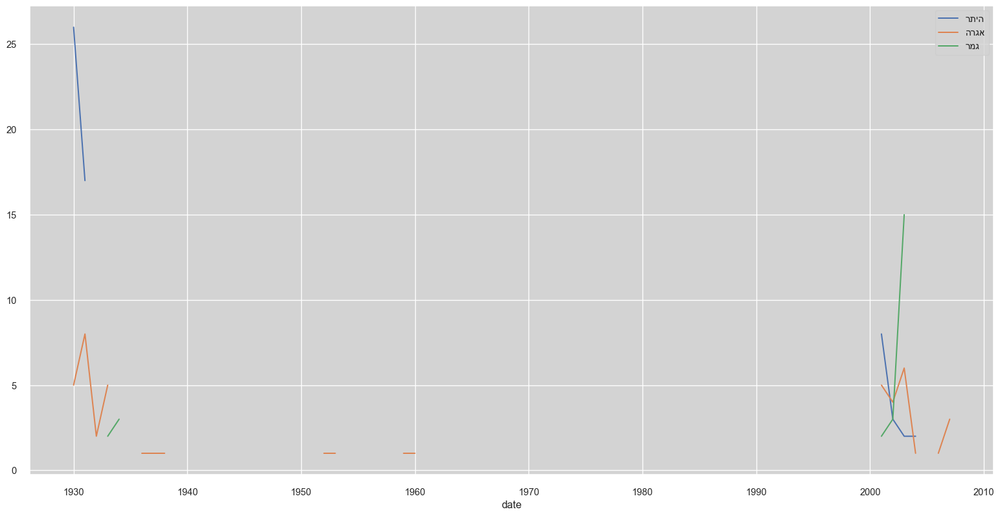

In [ ]:
type1 = [    "היתר-תכנית חתומה"
    ,
"היתר מילולי חתום"]
type2 = ["הודעת שומה על היטל השבחה,אגרות בניה,שוברי תשלום"]
type3 = ["תעודת גמר",
"תיק תעודת גמר",
"טופס 4"
    ,
"טופס 1"]
sample = all_docs[all_docs['tik_id']==730050]
#sample.set_index(years)
#plt.xticks(years)
dat = pd.DataFrame()
dat['date'] = years
dat = dat.set_index('date')
sample1 = sample[sample['type'].isin(type1)].groupby(['date']).size()
sample2 = sample[sample['type'].isin(type2)].groupby(['date']).size()
sample3 = sample[sample['type'].isin(type3)].groupby(['date']).size()
dat['רתיה'] = sample1
dat['הרגא'] = sample2
dat['רמג'] = sample3

#dat.reset_index().plot(x='date',y=['רתיה','הרגא','רמג'])
dat.plot()
plt.legend()

In [ ]:
dat

,רתיה,הרגא,רמג
date,,,
1920,NaN,NaN,NaN
1921,NaN,NaN,NaN
1922,NaN,NaN,NaN
1923,NaN,NaN,NaN
1924,NaN,NaN,NaN
1925,NaN,NaN,NaN
1926,NaN,NaN,NaN
1927,NaN,NaN,NaN
1928,NaN,NaN,NaN


C:\Users\user\AppData\Local\Programs\Python\Python37\lib\site-packages\pandas\plotting\_matplotlib\core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


,date,0
0,1920,0.0
1,1921,0.0
2,1922,0.0
3,1923,0.0
4,1924,0.0
5,1925,0.0
6,1926,0.0
7,1927,0.0
8,1928,0.0
9,1929,0.0


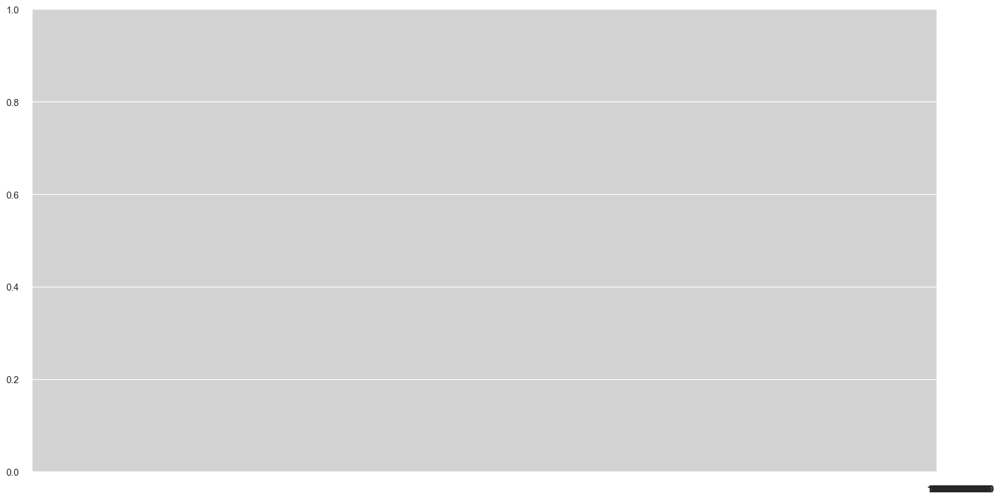

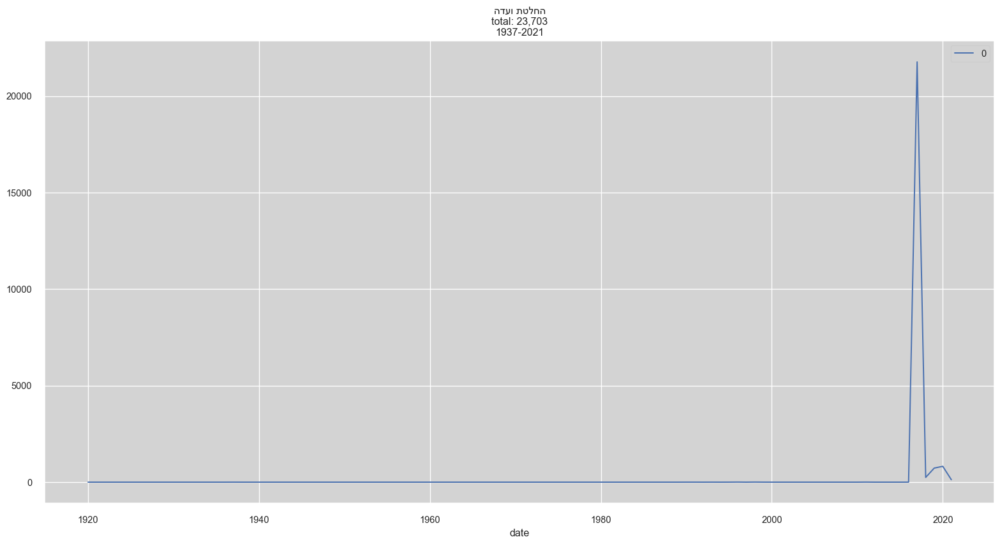

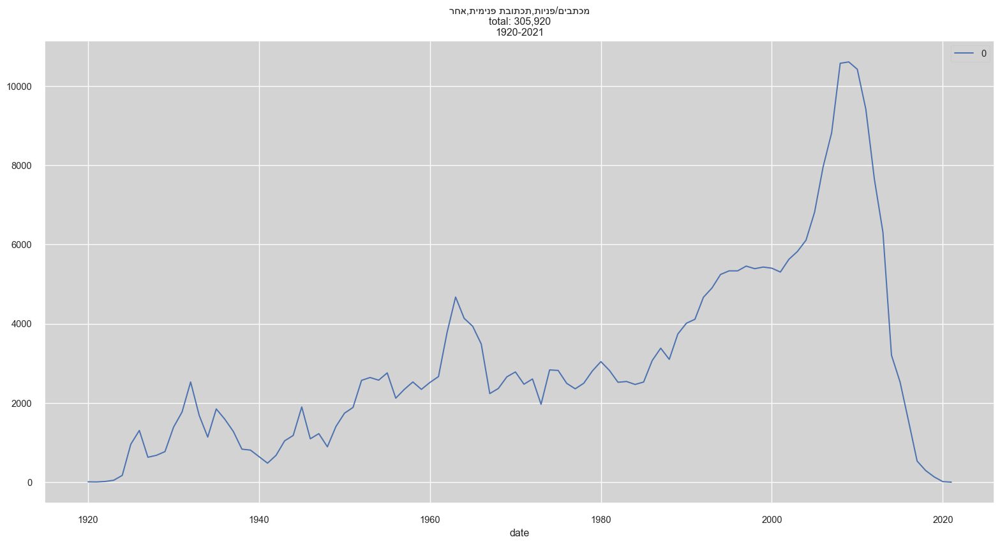

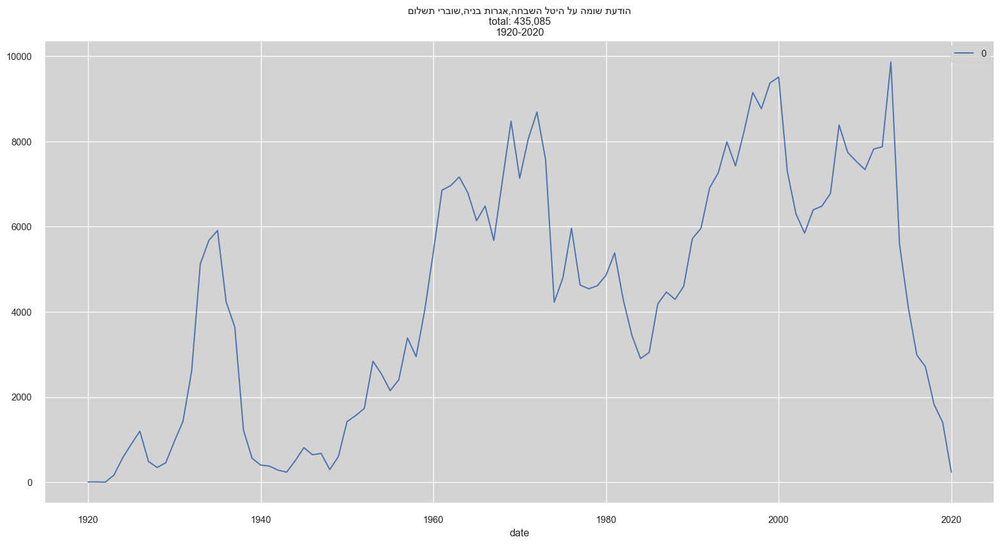

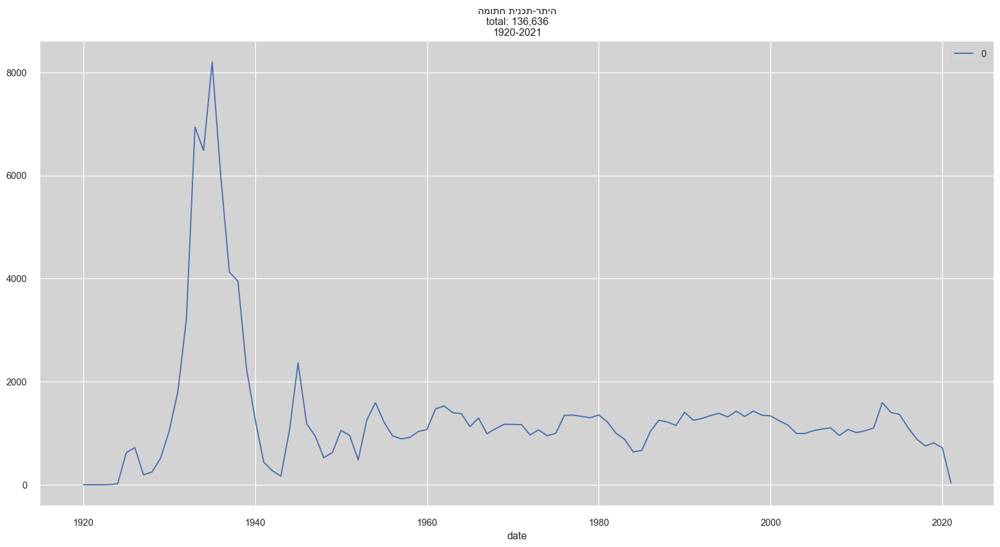

...

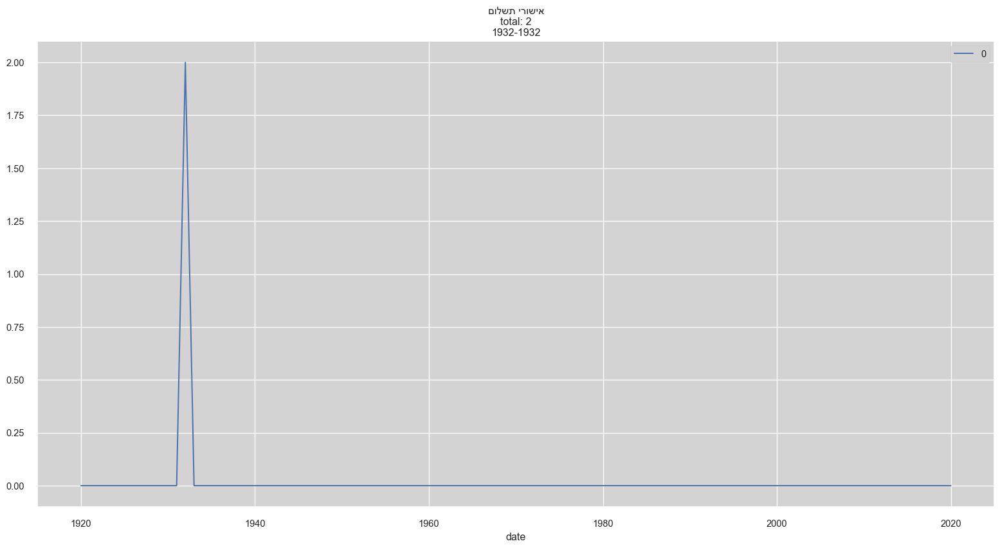

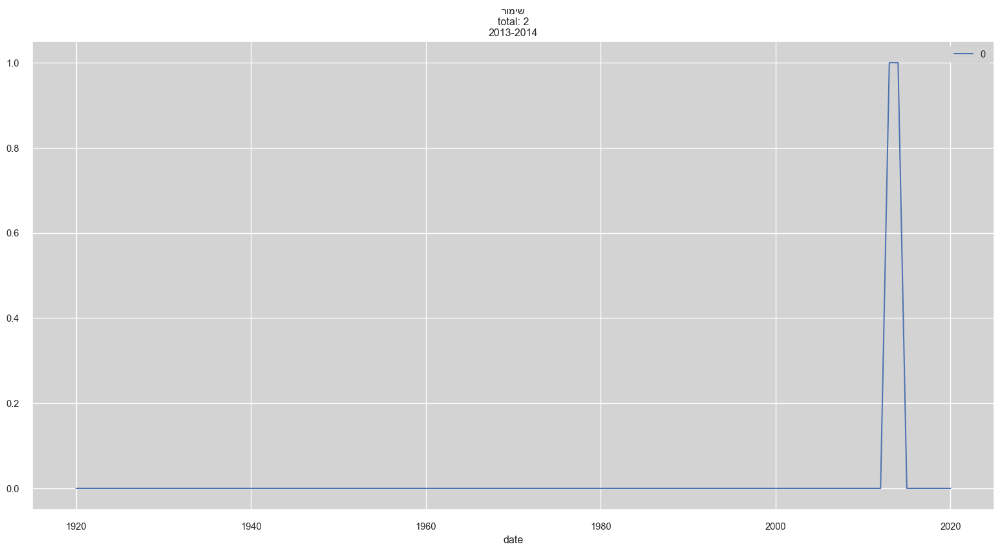

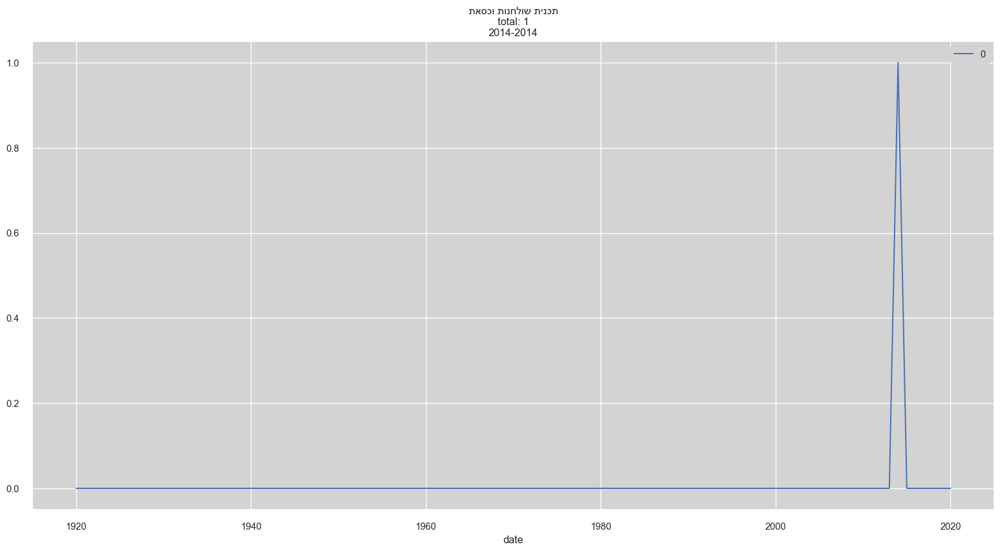

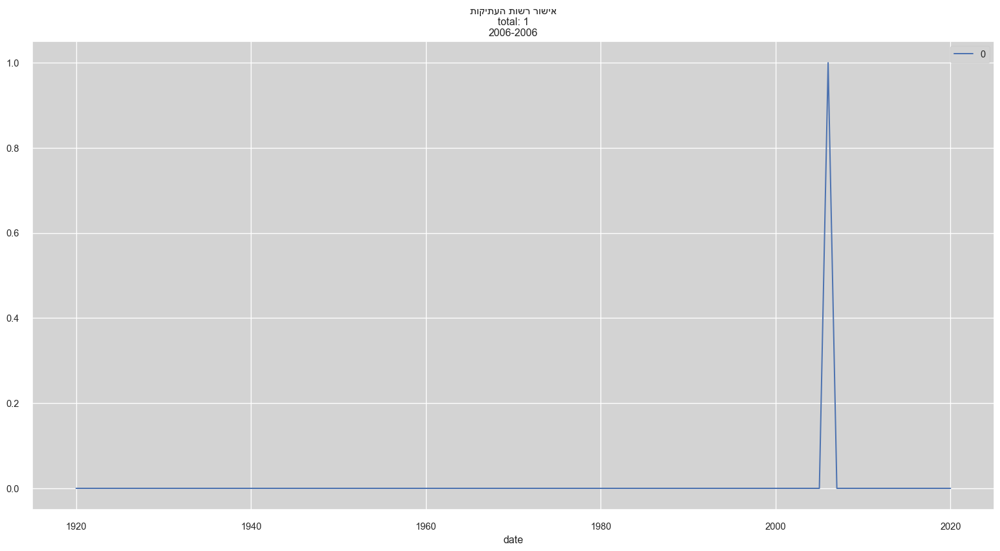

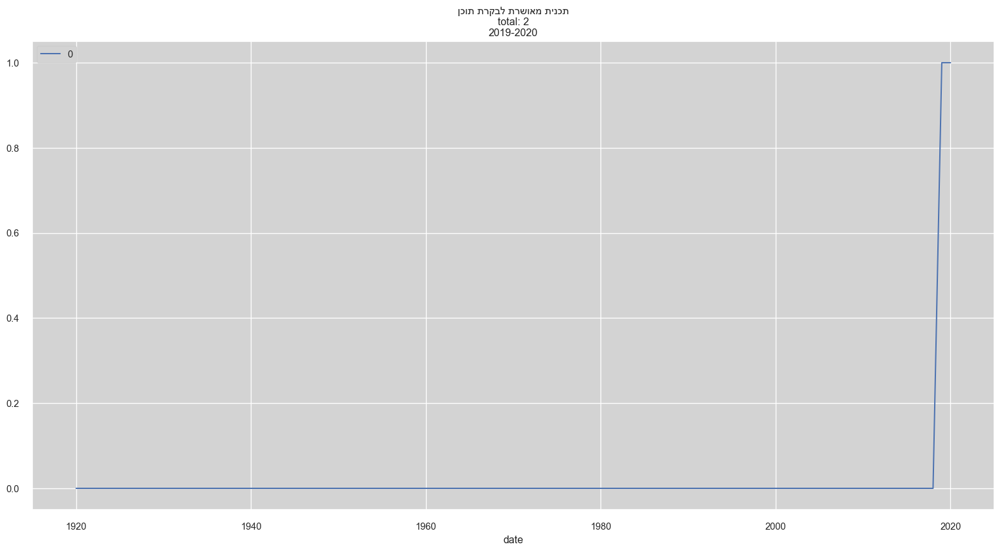

In [ ]:
to_filter = list(all_docs['type'].unique())
# to_filter=[
#      'טופס 1',
#      'טופס 4',
#     'היתר-תכנית חתומה',
#     'תעודת גמר',
#     'מפת מדידה להיתר',
#     'תוכנית סניטרית/חיבור ביוב',
#     'תוכניות לא חתומות',
#     'חשבון יציבות,תצהיר מהנדס',
#     'מסמכים הנדסיים תמא 38'
#     'היתר מילולי חתום',
#     'תוכנית סניטרית/חיבור ביוב',
#     'הודעת שומה על היטל השבחה,אגרות בניה,שוברי תשלום'
# ]
#filtered = list(filter(lambda x: x not in to_filter,cols))
index = 0


years = [year for year in range(1920,2021)]
plt.xticks(years)
plt.rcParams['axes.facecolor']='lightgray'
plt.rcParams['savefig.facecolor']='lightgray'
for col in to_filter:
    new_df = pd.DataFrame()
    new_df['date'] = years
    new_df  = new_df.set_index('date')


    sample = all_docs[(all_docs['type'] == col) & (all_docs['date']>1919)]

    #sample1 = sample1[sample1['date'].notna()]
    #sample1['date'] = sample1['date'].str[6:10]

    #sample1['date'] = sample1['date'].astype('int')
    sample = sample.groupby(['date','type']).size().reset_index()
    #print(sample.sum())
    new_df = new_df.merge(sample[['date',0]],on='date',how='outer').fillna(0)
    total_sum = (f"{sample[0].sum():,}")

    new_df.plot(y=0,x='date')
    col = str(col)
    plt.title(col[::-1]+'\n'+'total: ' + total_sum+'\n'+str(sample['date'].min())+'-'+str(sample['date'].max()))
    col_name = col.replace(',','_').replace('/','_').replace(' ','_').replace('"','')
    #print(new_df)
    #new_df = pd.concat([new_df,sample],axis=1)
    #new_df = new_df.merge(sample[['date',0]],on='date',how='outer')
    #sample = sample.set_index('date')
    #new_df[col] = sample[0]
    plt.savefig('figs/'+col_name)
    #sample.to_csv(col_name+'.csv',index=False)

    #plt.legend()
#plt.show()
new_df




In [ ]:
sample

,ktatrova,ms_gush,ms_chelka,multiple_gush_chelka,address,tik_id,page_number,row_number,date,type,request,permit,size,document
0,11,7221,19,NaN,בורלא יהודה 29,21160290,1,1,2017,החלטת ועדה,19940752,NaN,87.1KB,X:\Data\ArchiveTLV\results\11\21160290\RBM_19940752_3_20170427175618.pdf
1,11,7221,19,NaN,בורלא יהודה 29,21160290,1,2,2017,החלטת ועדה,19940752,NaN,85.7KB,X:\Data\ArchiveTLV\results\11\21160290\RBM_19940752_2_20170427175620.pdf
2,11,7221,19,NaN,בורלא יהודה 29,21160290,1,3,2017,החלטת ועדה,19940752,NaN,99.8KB,X:\Data\ArchiveTLV\results\11\21160290\RBM_19940752_6_20170427175616.pdf
3,11,7221,19,NaN,בורלא יהודה 29,21160290,1,4,2017,החלטת ועדה,19961670,NaN,96.7KB,X:\Data\ArchiveTLV\results\11\21160290\RBM_19961670_1_20170427215350.pdf
4,11,7221,19,NaN,בורלא יהודה 29,21160290,1,5,2017,החלטת ועדה,19940752,NaN,92.3KB,X:\Data\ArchiveTLV\results\11\21160290\RBM_19940752_4_20170427175609.pdf
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4253868,94,7203,61,"7203 / 60, 7203 / 61",אלנקווה 90,41470900,1,2,2017,החלטת ועדה,19980802,NaN,85.8KB,X:\Data\ArchiveTLV\results\94\41470900\RBM_19980802_1_20170428021032.pdf
4253869,94,7203,61,"7203 / 60, 7203 / 61",אלנקווה 90,41470900,1,3,2017,החלטת ועדה,19990776,NaN,94.1KB,X:\Data\ArchiveTLV\results\94\41470900\RBM_19990776_1_20170428044659.pdf
4253870,94,7203,61,"7203 / 60, 7203 / 61",אלנקווה 90,41470900,1,4,2017,החלטת ועדה,19991103,NaN,97.2KB,X:\Data\ArchiveTLV\results\94\41470900\RBM_19991103_1_20170428051235.pdf
4253871,94,7203,61,"7203 / 60, 7203 / 61",אלנקווה 90,41470900,1,5,2017,החלטת ועדה,19961535,NaN,91.2KB,X:\Data\ArchiveTLV\results\94\41470900\RBM_19961535_1_20170427214424.pdf


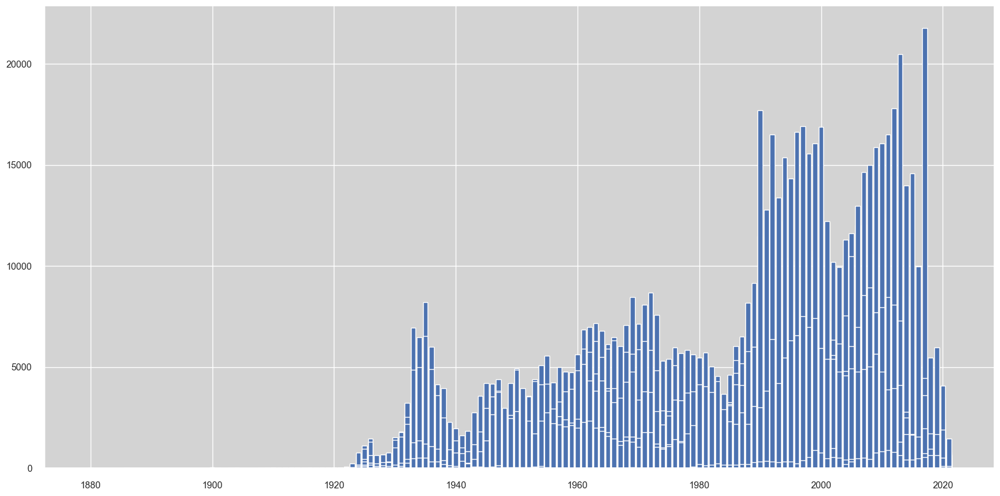

In [ ]:

sample = all_docs.groupby(['date','type']).size().reset_index()

#sample.plot(label='total',y=0,x='date')
plt.bar(sample['date'],height=sample[0])
#col_name = col.replace(',','_').replace('/','_').replace(' ','_').replace('"','')
col_name = 'total_count_hist'
plt.savefig(col_name)
sample.to_csv(col_name+'.csv',index=False)


In [ ]:
all_docs

,ktatrova,ms_gush,ms_chelka,multiple_gush_chelka,address,tik_id,page_number,row_number,date,type,request,permit,size,document
0,11,7221,19,NaN,בורלא יהודה 29,21160290,1,1,2017,החלטת ועדה,19940752,NaN,87.1KB,X:\Data\ArchiveTLV\results\11\21160290\RBM_19940752_3_20170427175618.pdf
1,11,7221,19,NaN,בורלא יהודה 29,21160290,1,2,2017,החלטת ועדה,19940752,NaN,85.7KB,X:\Data\ArchiveTLV\results\11\21160290\RBM_19940752_2_20170427175620.pdf
2,11,7221,19,NaN,בורלא יהודה 29,21160290,1,3,2017,החלטת ועדה,19940752,NaN,99.8KB,X:\Data\ArchiveTLV\results\11\21160290\RBM_19940752_6_20170427175616.pdf
3,11,7221,19,NaN,בורלא יהודה 29,21160290,1,4,2017,החלטת ועדה,19961670,NaN,96.7KB,X:\Data\ArchiveTLV\results\11\21160290\RBM_19961670_1_20170427215350.pdf
4,11,7221,19,NaN,בורלא יהודה 29,21160290,1,5,2017,החלטת ועדה,19940752,NaN,92.3KB,X:\Data\ArchiveTLV\results\11\21160290\RBM_19940752_4_20170427175609.pdf
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4255208,94,7203,113,"7203 / 112, 7203 / 113",וקנין רפי 6,48610060,5,7,1999,תיק מידע,NaN,NaN,72.7KB,X:\Data\ArchiveTLV\results\94\48610060\13143250.pdf
4255209,94,7203,113,"7203 / 112, 7203 / 113",וקנין רפי 6,48610060,5,8,1999,תיק מידע,NaN,NaN,72.7KB,X:\Data\ArchiveTLV\results\94\48610060\13143251.pdf
4255210,94,7203,113,"7203 / 112, 7203 / 113",וקנין רפי 6,48610060,5,9,1999,תוכנית סניטרית/חיבור ביוב,NaN,NaN,28.0KB,X:\Data\ArchiveTLV\results\94\48610060\13143249.pdf
4255211,94,7203,113,"7203 / 112, 7203 / 113",וקנין רפי 6,48610060,5,10,1996,"מכתבים/פניות,תכתובת פנימית,אחר",NaN,NaN,24.7KB,X:\Data\ArchiveTLV\results\94\48610060\13143231.pdf


In [ ]:
sample

,date,type,0
0,1880,תיק תיעוד,3
1,1886,בקשה,1
2,1900,אישורי תחנות-על גבי מסמכי A4 ועל גבי תוכניות,2
3,1900,היתר מילולי חתום,2
4,1900,"ועדת ערר,ועדת משנה,רשות רישוי,ועדה מחוזית",1
...,...,...,...
2963,2021,תכנית הבקשה להיתר (אדריכלות),2
2964,2021,תכנית מתוקנת (אדריכלות),1448
2965,2021,תעודת גמר,82
2966,2021,תקנה 27-תשריט לטאבו,93


In [ ]:
all_docs = pd.read_csv('all_docs.csv')
all_docs = all_docs[all_docs['date'].notna()]
all_docs['date'] = all_docs['date'].str[6:10]

all_docs['date'] = all_docs['date'].astype('int')


In [ ]:
cat_values = all_docs.set_index(['tik_id','date','type']).rename_axis('0',axis=1).unstack()
all_docs = pd.read_csv('all_docs.csv')

cat_values['sum'] = cat_values.sum(axis=1)
cat_values = cat_values.reset_index()
with_years = cat_values.groupby('tik_id').apply(lambda x: x.loc[x['sum'].idxmax(), 'date'])
with_years  = with_years.merge(all_docs[['tik_id','address']], on=['tik_id'], how='inner')
with_years

,tik_id,,address
0,10010,1994.0,"האטד 2, יפו 1, יפו 1 א, פינס 48, ,"
1,10010,1994.0,"האטד 2, יפו 1, יפו 1 א, פינס 48, ,"
2,10010,1994.0,"האטד 2, יפו 1, יפו 1 א, פינס 48, ,"
3,10010,1994.0,"האטד 2, יפו 1, יפו 1 א, פינס 48, ,"
4,10010,1994.0,"האטד 2, יפו 1, יפו 1 א, פינס 48, ,"
...,...,...,...
4102809,99995010,2002.0,גבול עירוני 501
4102810,99995010,2002.0,גבול עירוני 501
4102811,99995010,2002.0,גבול עירוני 501
4102812,99995010,2002.0,גבול עירוני 501


In [ ]:
all_docs = pd.read_csv('all_docs.csv')
sample1 = all_docs[all_docs['type']=='תוכניות היסטוריות שימור']

sample1 = sample1[sample1['date'].notna()]
sample1['date'] = sample1['date'].str[6:10]

sample1['date'] = sample1['date'].astype('int')
sample1 = sample1.groupby(['date','type','address']).size().reset_index()
sample1.address = sample1.address.str.split(',')
sample1 = sample1.explode('address')
shimur_dict = sample1.groupby('address')['date',0].max().reset_index().groupby('date')['address'].apply(lambda x:list(x)).to_dict()
shimur_dict
# with_xy = pd.read_csv('TLV_addresses.csv')
# with_xy
# with_xy['AddressFull'] = with_xy['trechov'].str.strip() +' '+with_xy['msbayit'].astype(int).astype(str).str.strip() +''+ with_xy['knisa'].str.strip()
# with_xy_deduped = with_xy[['AddressFull','lat','lon']].set_index(['AddressFull']).drop_duplicates()
# with_xy_deduped = with_xy_deduped[~with_xy_deduped.index.duplicated(keep='first')]
# address_dict = with_xy_deduped.to_dict(orient='index_names')
# address_dict


C:\Users\user\AppData\Local\Programs\Python\Python37\lib\site-packages\ipykernel_launcher.py:11: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  # This is added back by InteractiveShellApp.init_path()


{1913: [' פינס 32', ' שרעבי 26', 'כפר סבא 25'],
 1923: [' יפו 26', 'הקישון 1', 'לוינסקי 73'],
 1924: [' המשביר 1',
  ' נחלת בנימין 23 א',
  'השוק 8',
  'יפו 36',
  'נחלת בנימין 23'],
 1925: [' אילת 2',
  ' אפ"ק 1',
  ' בלפור 2',
  ' הרצל 51',
  ' הרצל 59',
  ' השוק 28',
  ' השוק 3',
  ' השוק 6',
  ' ירושלים 1',
  ' מרחביה 4',
  ' ראשונים 10',
  'אלנבי 63',
  'גאולה 23',
  'גאולה 44',
  'הירקון 36',
  'הרצל 29',
  'השוק 2',
  'וולפסון 17',
  'יהודה הלוי 10',
  'יהודה הלוי 131',
  'כרמיה 24',
  'לוינסקי 34',
  'מטלון 24',
  'מטלון 29',
  'נחמני 12',
  'סירקין 29',
  'ראשונים 8',
  'תרצה 6'],
 1926: [' בגין מנחם 42',
  ' הרצל 27',
  ' יפו 34',
  ' מרכלת 7',
  ' מרכלת 9',
  'גרוזנברג 21',
  'המשביר 2',
  'השפלה 1',
  'לבונטין 14',
  'לוינסקי 4 א',
  'מוהליבר 37',
  'סירקין 3',
  'רבינוביץ שפ"ר 10',
  'רמב"ם 17'],
 1927: ['מרכז בעלי מלאכה 35', 'שמרלינג 8'],
 1928: [' אחד העם 44',
  ' לילינבלום 2',
  ' נחמני 2',
  'אלנבי 53 א',
  'אלנבי 89',
  'ביל"ו 4',
  'יבנה 30',
  'יבנה 5',
  'פינס 29']

In [ ]:
addresses_keys = addresses.keys()
def match_img(row):
    _address = row['address'].translate(str.maketrans('', '', string.punctuation))
    _address = _address.split(' ')
    if _address[-1].isalpha():
        _address = ' '.join(_address[:-1])
    else:
        _address = ' '.join(_address)
    if _address in addresses_keys:
        return addresses[_address]
    else:
        return ''
df['img'] = df.apply(match_img,axis=1)
cluster_as['img_list']  = cluster_as.apply(match_img,axis=1)
cluster_as['img_list'].nunique()

C:\Users\user\AppData\Local\Programs\Python\Python37\lib\site-packages\ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


1

In [ ]:
addresses.keys()

dict_keys(['ברנדיס 1', 'ברנדיס 10', 'ברנדיס 11', 'ברנדיס 12', 'ברנדיס 13', 'ברנדיס 14', 'ברנדיס 16', 'ברנדיס 17', 'ברנדיס 18', 'ברנדיס 19', 'ברנדיס 2', 'ברנדיס 20', 'ברנדיס 21', 'ברנדיס 22', 'ברנדיס 23', 'ברנדיס 24', 'ברנדיס 25', 'ברנדיס 26', 'ברנדיס 27', 'ברנדיס 28', 'ברנדיס 29', 'ברנדיס 3', 'ברנדיס 30', 'ברנדיס 31', 'ברנדיס 32', 'ברנדיס 33', 'ברנדיס 34', 'ברנדיס 35', 'ברנדיס 37', 'ברנדיס 38', 'ברנדיס 39', 'ברנדיס 4', 'ברנדיס 40', 'ברנדיס 41', 'ברנדיס 42', 'ברנדיס 43', 'ברנדיס 45', 'ברנדיס 47', 'ברנדיס 47א', 'ברנדיס 49', 'ברנדיס 5', 'ברנדיס 51', 'ברנדיס 6', 'ברנדיס 7', 'ברנדיס 8', 'ברנדיס 9', 'צריפין 16', 'צריפין 18', 'צריפין 20', 'צריפין 22', 'צריפין 23', 'צריפין 24', 'צריפין 25', 'צריפין 26', 'צריפין 27', 'צריפין 28', 'צריפין 29', 'צריפין 31', 'צריפין 32', 'צריפין 33', 'צריפין 34', 'צריפין 35', 'צריפין 36', 'צריפין 37', 'צריפין 39', 'מלצט 1', 'מלצט 10', 'מלצט 11', 'מלצט 12', 'מלצט 13', 'מלצט 14', 'מלצט 15', 'מלצט 16', 'מלצט 17', 'מלצט 18', 'מלצט 19', 'מלצט 19א', 'מלצט 1א', 'מלצט 2',

In [ ]:
addresses_keys = addresses.keys()
def match_img(row):
    address_list = []
    ads = row.split(',')
    for ad in ads:
        _address = ad.translate(str.maketrans('', '', string.punctuation)).strip()
        if len(_address)>3:
            if _address[-1].isalpha():
                _address = _address[:-1]

            else:
                _address = _address
            if _address in addresses_keys:
                address_list.append(addresses[_address])
    if len(address_list)>0:
        return ','.join(address_list)
    else:
        return None
cluster_as['img_list'] = cluster_as['address'].apply(match_img)
cluster_as.dropna(subset=['coords'],inplace=True)
cluster_as.img_list.nunique()


C:\Users\user\AppData\Local\Programs\Python\Python37\lib\site-packages\ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\user\AppData\Local\Programs\Python\Python37\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


4751

<AxesSubplot:>

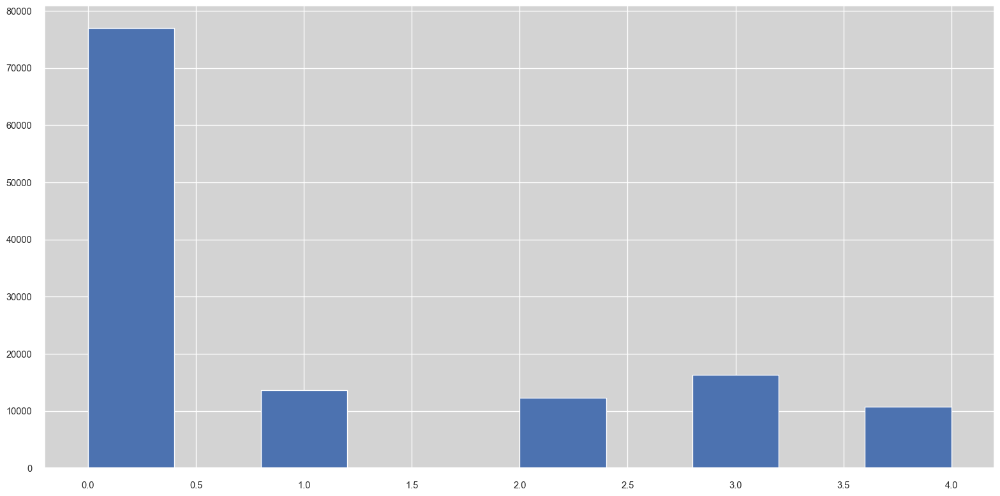

In [ ]:
all_docs = pd.read_csv('all_docs.csv')
all_docs = all_docs[all_docs['date'].notna()]
all_docs['date'] = all_docs['date'].str[6:10]
all_docs['date'] = all_docs['date'].astype('int')
all_docs['tik_id'] = all_docs['tik_id'].astype('float')



In [ ]:
elad_tikim = pd.read_csv('elad_100_buildings.csv').dropna()
elad_tikim['important_years'] = elad_tikim['important_years'].str.split('\n')
elad_tikim['origin_year'] = elad_tikim['origin_year'].str.split('\n')
def get_range(row):
    if row[0] is not '-':
        for d in row:
            if '-' in str(d):
                _d = d.split('-')
                _d = [int(i) for i in _d]
                diff = max(_d) - min(_d)
                for i in range(0,diff):
                    row.append(int(min(_d) + i))
        __d = list(filter(lambda x:'-' not in str(x),row))
        return __d
elad_tikim['important_years'] = elad_tikim['important_years'].apply(lambda x:get_range(x))
elad_tikim['origin_year'] = elad_tikim['origin_year'].apply(lambda x:get_range(x))
elad_tikim = elad_tikim.merge(a[['tik_id','peaks']],on='tik_id')
elad_tikim

,tik_id,important_years,origin_year,peaks
0,40420.0,"[1963, 1932, 1933, 1934, 1935, 1936, 1944, 1945, 1946, 1953]",None,"[1937, 1967]"
1,30170.0,"[1947, 1927, 1928, 1929, 1930, 1937, 1938]","[1926, 1927, 1928, 1929, 1930]","[1931, 1970, 1991]"
2,40900.0,"[1928, 1934, 1935, 1936]",[1928],"[1947, 1986]"
3,40960.0,"[1947, 1933, 1937, 1941, 1942]",[1934],"[1947, 1990]"
4,271020.0,"[1926, 1927, 1930, 1931, 1932, 1933, 1938, 1939, 1940, 1941, 1942]",[1926],"[1930, 1968, 1989, 2012]"
5,100310.0,"[1926, 1977, 1978, 1983, 1984]",[1925],"[1945, 1978, 2012]"
6,20720.0,"[1935, 1936, 2006, 2007, 2008]",[1925],"[1935, 1969]"
7,140270.0,"[1932, 1998, 2000, 2001]",[1934],"[1932, 1987]"
8,730050.0,"[1957, 1930, 1933, 2001, 2002]",[1930],"[1946, 2007]"
9,140460.0,"[1932, 1941]",[1932],"[1943, 1987]"


In [ ]:
type1 = [    "היתר-תכנית חתומה"
    ,
"היתר מילולי חתום"]
type2 = ["הודעת שומה על היטל השבחה,אגרות בניה,שוברי תשלום"]
type3 = ["תעודת גמר",
"תיק תעודת גמר",
"טופס 4"
    ,
"טופס 1"]

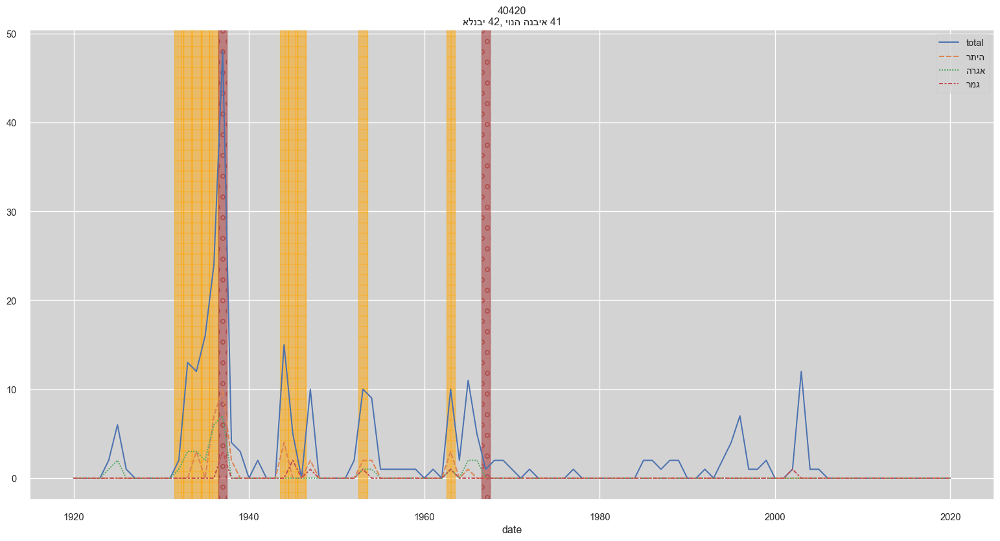

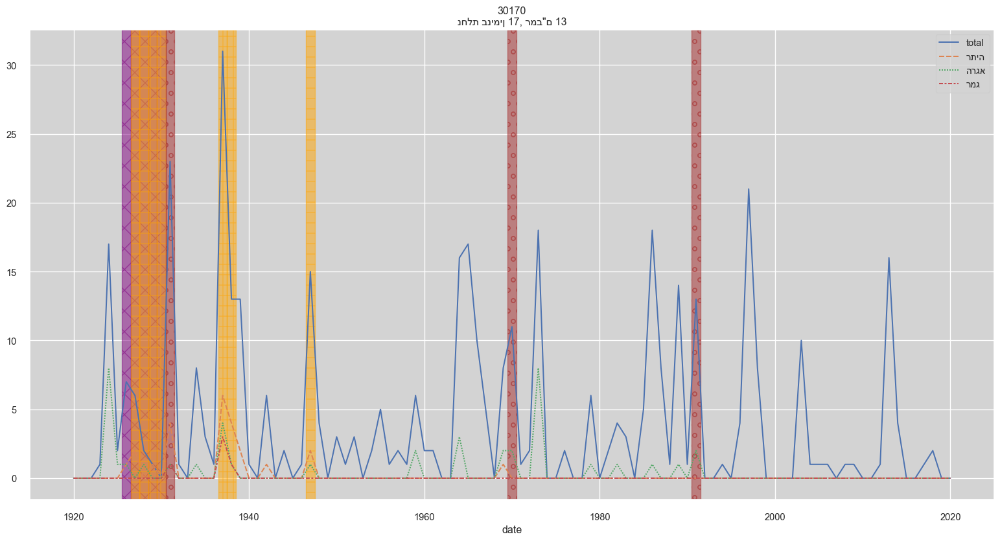

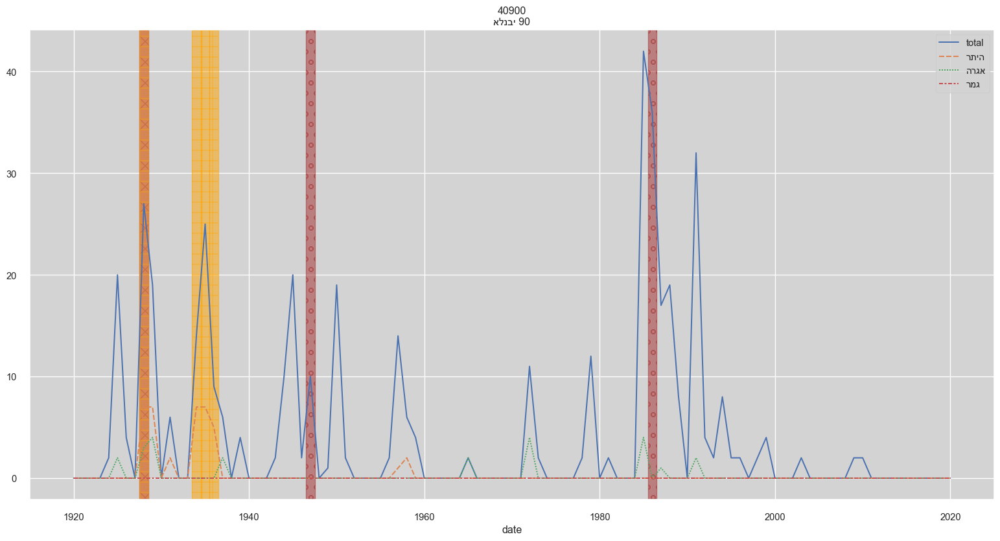

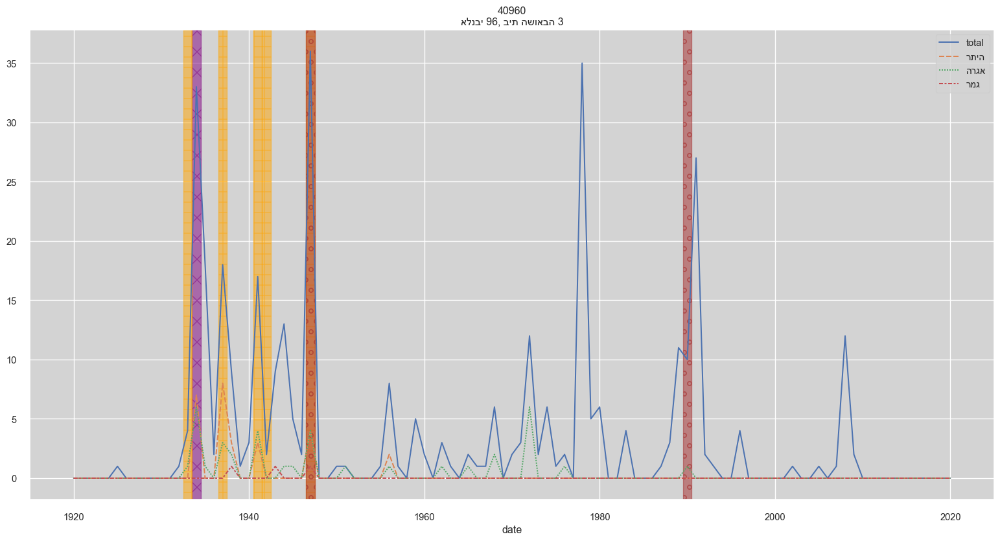

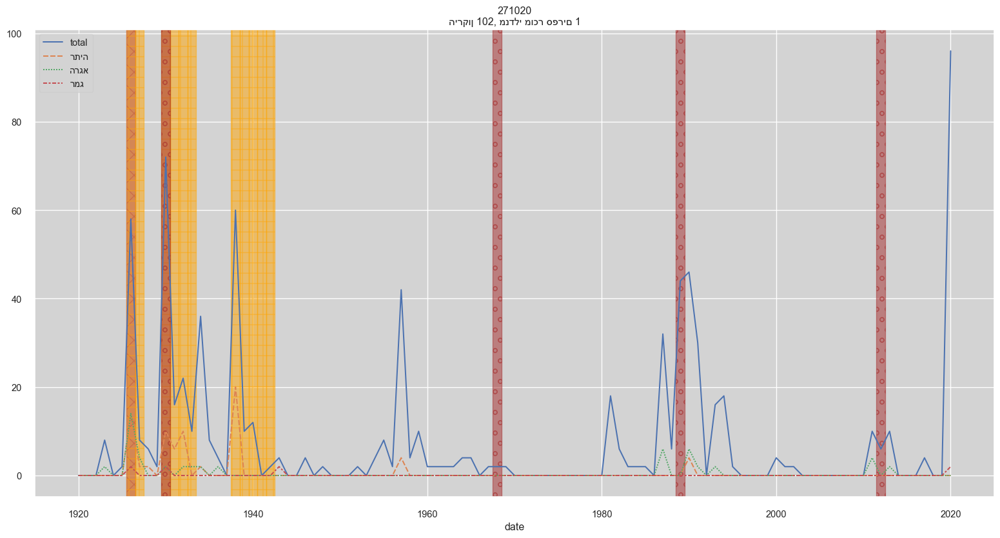

...

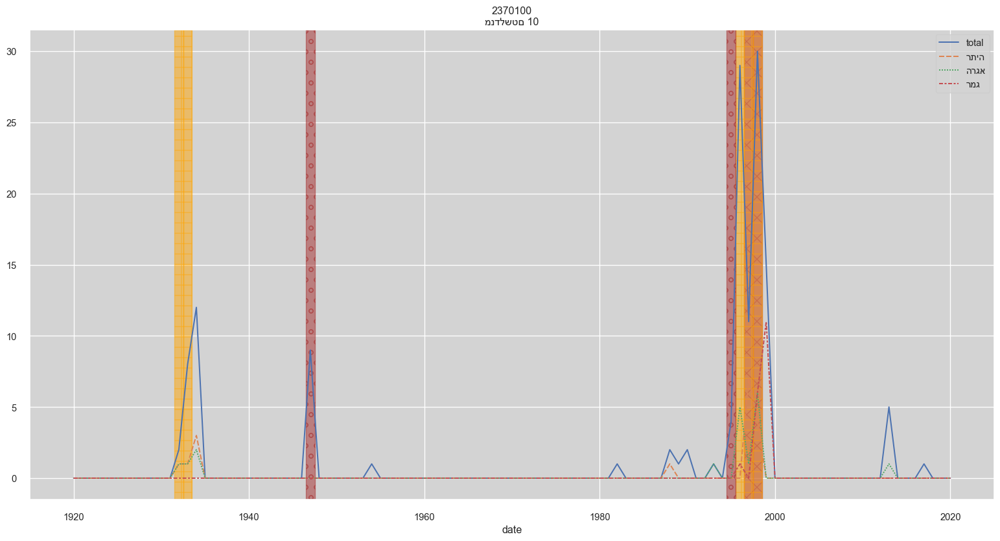

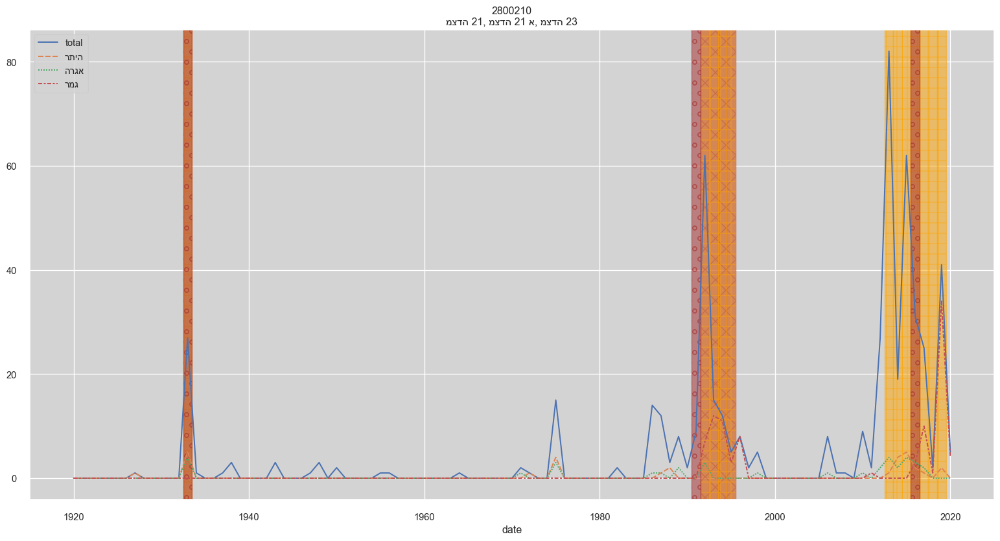

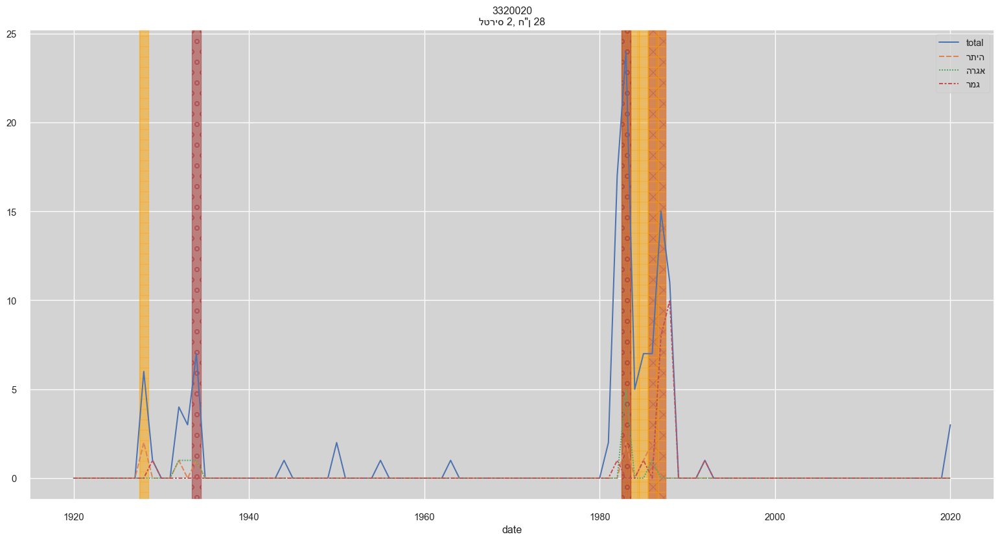

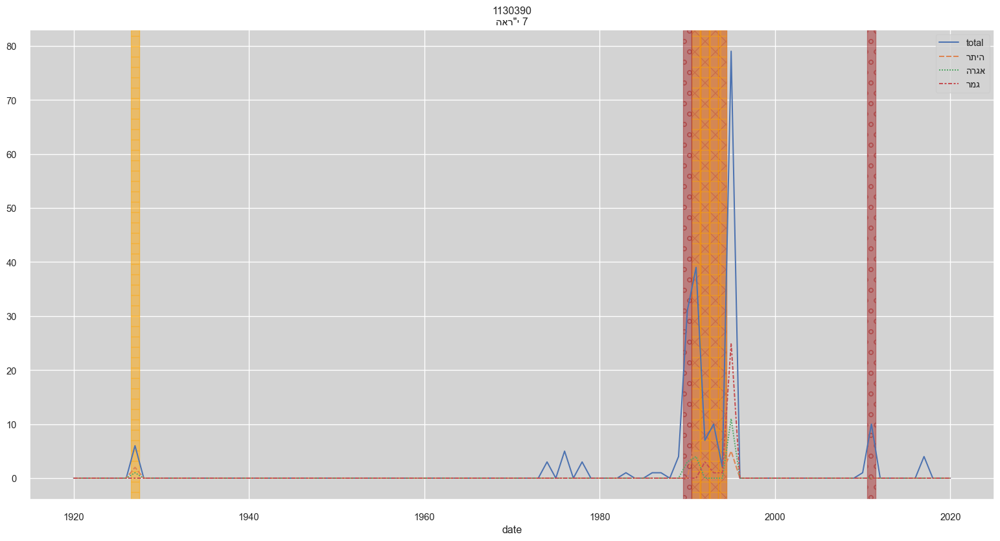

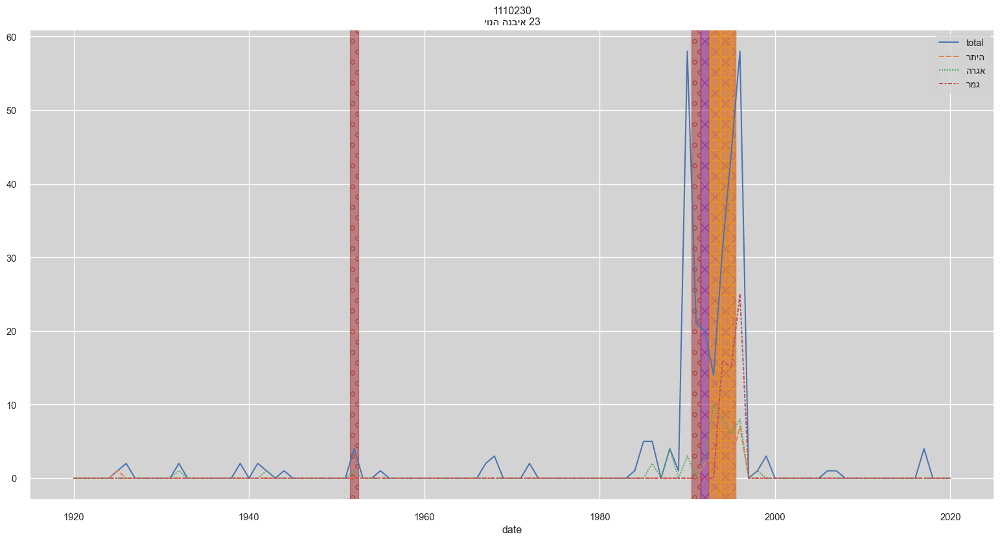

In [ ]:
for i,row in elad_tikim.iterrows():
    tik = row['tik_id']
    peaks = list(row['peaks'])
    origin_years = row['origin_year']
    imp_years = row['important_years']
    sample = all_docs[all_docs['tik_id']==tik]
    grouped = sample.groupby('date').size().to_frame()
    new_df = pd.DataFrame()
    new_df['date'] = years
    new_df = new_df.set_index('date')
    new_df = new_df.merge(grouped,left_index=True, right_index=True,how='outer').fillna(0)
    new_df = new_df.rename(columns={0:'total'})
    sample1 = sample[sample['type'].isin(type1)].groupby(['date']).size()
    sample2 = sample[sample['type'].isin(type2)].groupby(['date']).size()
    sample3 = sample[sample['type'].isin(type3)].groupby(['date']).size()
    new_df['רתיה'] = sample1
    new_df['הרגא'] = sample2
    new_df['רמג'] = sample3
    new_df = new_df.fillna(0)
    address = sample['address'].values[0]
    plt.title(str(int(tik))+'\n'+address)

    if origin_years:
        for year in origin_years:
            if ',' in str(year):
                year = year.split(',')
                for y in year:
                    plt.axvspan(float(y)-0.5,float(y)+0.5, alpha=0.5, color='purple',hatch='x')
            else:
                plt.axvspan(float(year)-0.5,float(year)+0.5, alpha=0.5, color='purple',hatch='x')
    if imp_years:
        for year in imp_years:
            if ',' in str(year):
                year = year.split(',')
                for y in year:
                    plt.axvspan(float(y)-0.5,float(y)+0.5, alpha=0.5, color='orange',hatch='+')
            else:
                plt.axvspan(float(year)-0.5,float(year)+0.5, alpha=0.5, color='orange',hatch='+')
    if peaks:
        for year in peaks:
            if ',' in str(year):
                year = year.split(',')
                for y in year:
                    plt.axvspan(float(y)-0.5,float(y)+0.5, alpha=0.5, color='brown',hatch='o')
            else:
                plt.axvspan(float(year)-0.5,float(year)+0.5, alpha=0.5, color='brown',hatch='o')
    address_name = str(address.replace(',','_').replace('/','_').replace(' ','_').replace('"',''))
    #new_df.plot()
    ax = sns.lineplot(data=new_df)

    plt.savefig('figs/'+address_name)
    plt.legend()
    plt.show()

In [ ]:
elad_tikim

,tik_id,important_years,origin_year,peaks
0,40420.0,"[1963, 1932, 1933, 1934, 1935, 1936, 1944, 1945, 1946, 1953]",None,"[1937, 1967]"
1,30170.0,"[1947, 1927, 1928, 1929, 1930, 1937, 1938]","[1926, 1927, 1928, 1929, 1930]","[1931, 1970, 1991]"
2,40900.0,"[1928, 1934, 1935, 1936]",[1928],"[1947, 1986]"
3,40960.0,"[1947, 1933, 1937, 1941, 1942]",[1934],"[1947, 1990]"
4,271020.0,"[1926, 1927, 1930, 1931, 1932, 1933, 1938, 1939, 1940, 1941, 1942]",[1926],"[1930, 1968, 1989, 2012]"
5,100310.0,"[1926, 1977, 1978, 1983, 1984]",[1925],"[1945, 1978, 2012]"
6,20720.0,"[1935, 1936, 2006, 2007, 2008]",[1925],"[1935, 1969]"
7,140270.0,"[1932, 1998, 2000, 2001]",[1934],"[1932, 1987]"
8,730050.0,"[1957, 1930, 1933, 2001, 2002]",[1930],"[1946, 2007]"
9,140460.0,"[1932, 1941]",[1932],"[1943, 1987]"
